# ANALYSIS AND PREDICTION OF UK ACCIDENTS IN 2020 THROUGH EDA, DATA MINING, AND MACHINE LEARNING TECHNIQUES

In [1]:
import warnings

# Filter out specific warning messages
warnings.filterwarnings("ignore")

# IMPORTING LIBRARIES

In [ ]:
!pip install geopandas
!pip install matplotlib


In [3]:
import sqlite3
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import rand_score
from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold, cross_val_score
from imblearn.under_sampling import RandomUnderSampler
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import IsolationForest
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import log_loss
from sklearn import metrics
from numpy import mean
from numpy import std
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.impute import KNNImputer
import folium
from folium.plugins import MarkerCluster
from sklearn.cluster import KMeans
import folium
from folium.plugins import MarkerCluster
import geopandas as gpd
from sklearn.cluster import KMeans
from sklearn.metrics import roc_curve, auc

from imblearn.under_sampling import RandomUnderSampler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.tree import plot_tree

from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import RidgeClassifier



# CONNECTION TO ACCIDENT DATABASE, QUERYING AND JOINING TABLES USING SQL 

In [4]:
#connecting to database
con = sqlite3.connect('accident_data_v1.0.0_2023.db')

In [5]:
cur = con.cursor()

In [6]:
accident_data = pd.read_sql(sql = "SELECT * FROM accident", con = con)

In [7]:
accident_data

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2017010001708,2017,010001708,532920.0,196330.0,-0.080107,51.650061,1,1,2,...,0,4,1,1,0,0,1,1,2,E01001450
1,2017010009342,2017,010009342,526790.0,181970.0,-0.173845,51.522425,1,3,2,...,0,4,1,2,0,0,1,1,2,E01004702
2,2017010009344,2017,010009344,535200.0,181260.0,-0.052969,51.514096,1,3,3,...,0,4,1,1,0,0,1,1,2,E01004298
3,2017010009348,2017,010009348,534340.0,193560.0,-0.060658,51.624832,1,3,2,...,4,4,2,2,0,0,1,1,2,E01001429
4,2017010009350,2017,010009350,533680.0,187820.0,-0.072372,51.573408,1,2,1,...,5,4,1,2,0,0,1,1,2,E01001808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461347,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,99,2,2,...,0,1,1,1,0,0,1,1,-1,-1
461348,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,0,1,1,1,0,0,1,2,-1,-1
461349,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,0,1,1,1,0,0,2,1,-1,-1
461350,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,0,1,1,1,0,0,1,2,-1,-1


In [8]:
vehicle_data =  pd.read_sql(sql = "SELECT * FROM vehicle", con = con)

In [9]:
vehicle_data

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,0,2017010001708,2017,010001708,1,9,0,18,1,5,...,6,1,24,5,1997,2,1,-1,-1,-1
1,1,2017010001708,2017,010001708,2,2,0,18,1,5,...,6,1,19,4,-1,-1,-1,-1,-1,-1
2,2,2017010009342,2017,010009342,1,9,0,18,5,1,...,6,1,33,6,1797,8,8,-1,9,1
3,3,2017010009342,2017,010009342,2,9,0,18,5,1,...,6,1,40,7,2204,2,12,-1,2,1
4,4,2017010009344,2017,010009344,1,9,0,18,3,7,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
849086,849086,2020991030297,2020,991030297,1,9,0,7,8,2,...,1,1,57,9,1968,2,2,AUDI A5,7,1
849087,849087,2020991030297,2020,991030297,2,5,0,16,6,2,...,5,1,38,7,1301,1,2,KTM 1290 SUPERDUKE,9,2
849088,849088,2020991030900,2020,991030900,1,9,0,7,8,2,...,6,2,68,10,1995,2,1,BMW X3,5,1
849089,849089,2020991030900,2020,991030900,2,1,0,18,6,2,...,6,1,76,11,-1,-1,-1,-1,9,1


In [10]:
casualty_data = pd.read_sql(sql = "SELECT * FROM casualty", con = con)

In [11]:
casualty_data

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,0,2017010001708,2017,010001708,1,1,2,2,18,4,3,0,0,1,0,0,9,1,2
1,1,2017010001708,2017,010001708,2,2,1,1,19,4,2,0,0,0,0,0,2,-1,-1
2,2,2017010001708,2017,010001708,2,3,2,1,18,4,1,0,0,0,0,0,2,-1,-1
3,3,2017010009342,2017,010009342,1,1,2,2,33,6,3,0,0,1,0,0,9,1,5
4,4,2017010009344,2017,010009344,3,1,1,2,31,6,3,0,0,0,0,0,9,1,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
600327,600327,2020991027064,2020,991027064,2,1,1,1,11,3,2,0,0,0,0,0,1,1,2
600328,600328,2020991029573,2020,991029573,1,1,3,2,63,9,3,10,1,0,0,0,0,1,10
600329,600329,2020991030297,2020,991030297,2,1,1,1,38,7,2,0,0,0,0,0,5,2,9
600330,600330,2020991030900,2020,991030900,2,1,1,1,76,11,3,0,0,0,0,0,1,1,9


In [12]:
lsoa_data = pd.read_sql(sql = "SELECT * FROM lsoa", con = con)

In [13]:
lsoa_data

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,1.298652e+05,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43
1,2,E01000002,City of London 001B,City of London 001B,2.284189e+05,2707.986202,937edbc3-c1bf-4d35-b274-b0a1480a7c09
2,3,E01000003,City of London 001C,City of London 001C,5.905477e+04,1224.774479,2686dcaf-10b9-4736-92af-4788d4feaa69
3,4,E01000004,City of London 001D,City of London 001D,2.544551e+06,10718.466240,3c493140-0b3f-4b9a-b358-22011dc5fb89
4,5,E01000005,City of London 001E,City of London 001E,1.895782e+05,2275.809358,b569093d-788d-41be-816c-d6d7658b2311
...,...,...,...,...,...,...,...
34373,34374,W01001892,Cardiff 020D,Caerdydd 020D,2.699088e+05,2537.220060,1a25aa1e-5db5-4d32-8355-473409dbd69f
34374,34375,W01001893,Cardiff 010B,Caerdydd 010B,4.288488e+06,9807.284401,b6af5e24-eb2a-404a-98a6-a282037b3e10
34375,34376,W01001894,Cardiff 010C,Caerdydd 010C,3.337511e+05,2929.546177,72d16f53-115d-4926-936d-2f1b1d659d46
34376,34377,W01001895,Cardiff 010D,Caerdydd 010D,1.360174e+06,8141.281226,8e105eb9-f68e-4cdb-bca6-b49f6592cb71


In [14]:
accident_info = cur.execute(f'PRAGMA table_info(accident)')

In [15]:
accident_list= [x[1] for x in list(accident_info.fetchall())]

In [16]:
accident_list

['accident_index',
 'accident_year',
 'accident_reference',
 'location_easting_osgr',
 'location_northing_osgr',
 'longitude',
 'latitude',
 'police_force',
 'accident_severity',
 'number_of_vehicles',
 'number_of_casualties',
 'date',
 'day_of_week',
 'time',
 'local_authority_district',
 'local_authority_ons_district',
 'local_authority_highway',
 'first_road_class',
 'first_road_number',
 'road_type',
 'speed_limit',
 'junction_detail',
 'junction_control',
 'second_road_class',
 'second_road_number',
 'pedestrian_crossing_human_control',
 'pedestrian_crossing_physical_facilities',
 'light_conditions',
 'weather_conditions',
 'road_surface_conditions',
 'special_conditions_at_site',
 'carriageway_hazards',
 'urban_or_rural_area',
 'did_police_officer_attend_scene_of_accident',
 'trunk_road_flag',
 'lsoa_of_accident_location']

In [17]:
vehicle_info = cur.execute(f'PRAGMA table_info(vehicle)')

In [18]:
#vehicle_info.fetchall()

In [19]:
vehicle_list= [x[1] for x in list(vehicle_info.fetchall())]

In [20]:
vehicle_list

['vehicle_index',
 'accident_index',
 'accident_year',
 'accident_reference',
 'vehicle_reference',
 'vehicle_type',
 'towing_and_articulation',
 'vehicle_manoeuvre',
 'vehicle_direction_from',
 'vehicle_direction_to',
 'vehicle_location_restricted_lane',
 'junction_location',
 'skidding_and_overturning',
 'hit_object_in_carriageway',
 'vehicle_leaving_carriageway',
 'hit_object_off_carriageway',
 'first_point_of_impact',
 'vehicle_left_hand_drive',
 'journey_purpose_of_driver',
 'sex_of_driver',
 'age_of_driver',
 'age_band_of_driver',
 'engine_capacity_cc',
 'propulsion_code',
 'age_of_vehicle',
 'generic_make_model',
 'driver_imd_decile',
 'driver_home_area_type']

In [21]:
casualty_info = cur.execute(f'PRAGMA table_info(casualty)')

In [23]:
casualty_list= [x[1] for x in list(casualty_info.fetchall())]

In [24]:
casualty_list

['casualty_index',
 'accident_index',
 'accident_year',
 'accident_reference',
 'vehicle_reference',
 'casualty_reference',
 'casualty_class',
 'sex_of_casualty',
 'age_of_casualty',
 'age_band_of_casualty',
 'casualty_severity',
 'pedestrian_location',
 'pedestrian_movement',
 'car_passenger',
 'bus_or_coach_passenger',
 'pedestrian_road_maintenance_worker',
 'casualty_type',
 'casualty_home_area_type',
 'casualty_imd_decile']

In [25]:
lsoa_info = cur.execute(f'PRAGMA table_info(lsoa)')

In [26]:
#col_names = []
lsoa_list= [x[1] for x in list(lsoa_info.fetchall())]

In [27]:
lsoa_list

['objectid',
 'lsoa01cd',
 'lsoa01nm',
 'lsoa01nmw',
 'shape__area',
 'shape__length',
 'globalid']

In [28]:
all_col_names = []

In [29]:
all_col_names.append(accident_list)

In [30]:
all_col_names.append(vehicle_list)

In [31]:
all_col_names.append(casualty_list)

In [32]:
all_col_names.append(lsoa_list)

In [33]:
all_col_names

[['accident_index',
  'accident_year',
  'accident_reference',
  'location_easting_osgr',
  'location_northing_osgr',
  'longitude',
  'latitude',
  'police_force',
  'accident_severity',
  'number_of_vehicles',
  'number_of_casualties',
  'date',
  'day_of_week',
  'time',
  'local_authority_district',
  'local_authority_ons_district',
  'local_authority_highway',
  'first_road_class',
  'first_road_number',
  'road_type',
  'speed_limit',
  'junction_detail',
  'junction_control',
  'second_road_class',
  'second_road_number',
  'pedestrian_crossing_human_control',
  'pedestrian_crossing_physical_facilities',
  'light_conditions',
  'weather_conditions',
  'road_surface_conditions',
  'special_conditions_at_site',
  'carriageway_hazards',
  'urban_or_rural_area',
  'did_police_officer_attend_scene_of_accident',
  'trunk_road_flag',
  'lsoa_of_accident_location'],
 ['vehicle_index',
  'accident_index',
  'accident_year',
  'accident_reference',
  'vehicle_reference',
  'vehicle_type',

In [34]:
accident_count = cur.execute('SELECT Count(*) FROM accident ')

In [35]:
accident_count.fetchall()

[(461352,)]

In [36]:
casualty_count = cur.execute('SELECT Count(*) FROM casualty ')

In [37]:
casualty_count.fetchall()

[(600332,)]

In [38]:
vehicle_count = cur.execute('SELECT Count(*) FROM vehicle ')

In [39]:
vehicle_count.fetchall()

[(849091,)]

In [40]:
lsoa_count = cur.execute('SELECT Count(*) FROM lsoa ')

In [41]:
lsoa_count.fetchall()

[(34378,)]

# Accident Data Of Year 2020

In [42]:
accident_data_2020 = pd.read_sql(sql = "SELECT * FROM accident where accident_year = 2020 ", con = con)

In [43]:
vehicle_data_2020 = pd.read_sql(sql = "SELECT * FROM vehicle where accident_year = 2020 ", con = con)

In [44]:
casualty_data_2020 = pd.read_sql(sql = "SELECT * FROM casualty where accident_year = 2020 ", con = con)

In [45]:
# lsoa_data_2020 = pd.read_sql(sql = "SELECT * FROM lsoa", con = con)

# Creating DataFrames For 2020 Accident Data

In [46]:
accident_df = pd.DataFrame(accident_data_2020, columns = accident_list)

In [47]:
vehicle_df = pd.DataFrame(vehicle_data_2020, columns = vehicle_list)

In [48]:
casualty_df = pd.DataFrame(casualty_data_2020, columns = casualty_list)

In [49]:
accident_df.columns

Index(['accident_index', 'accident_year', 'accident_reference',
       'location_easting_osgr', 'location_northing_osgr', 'longitude',
       'latitude', 'police_force', 'accident_severity', 'number_of_vehicles',
       'number_of_casualties', 'date', 'day_of_week', 'time',
       'local_authority_district', 'local_authority_ons_district',
       'local_authority_highway', 'first_road_class', 'first_road_number',
       'road_type', 'speed_limit', 'junction_detail', 'junction_control',
       'second_road_class', 'second_road_number',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag', 'lsoa_of_accident_location'],
      dtype='object')

# Merging of Accident, Casualty and Vehicle Dataframes of 2020

In [50]:
# Merging accident_df and casualty_df on 'Accident_Index'
df = pd.merge(accident_df, casualty_df, on='accident_index', how='inner')

# Merging df and vehicle_df on 'Accident_Index'
df = pd.merge(df, vehicle_df, on='accident_index', how='inner')


In [51]:
df.columns

Index(['accident_index', 'accident_year_x', 'accident_reference_x',
       'location_easting_osgr', 'location_northing_osgr', 'longitude',
       'latitude', 'police_force', 'accident_severity', 'number_of_vehicles',
       'number_of_casualties', 'date', 'day_of_week', 'time',
       'local_authority_district', 'local_authority_ons_district',
       'local_authority_highway', 'first_road_class', 'first_road_number',
       'road_type', 'speed_limit', 'junction_detail', 'junction_control',
       'second_road_class', 'second_road_number',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag', 'lsoa_of_accident_location', 'casualty_index',
       'accident_year_y', 'accident_reference_y', 'vehicle_reference_x',
  

# Data Cleaning and Imputations

In [52]:
#checking for null values in the merged dataframe
df.isnull().sum()

accident_index             0
accident_year_x            0
accident_reference_x       0
location_easting_osgr     34
location_northing_osgr    34
                          ..
propulsion_code            0
age_of_vehicle             0
generic_make_model         0
driver_imd_decile          0
driver_home_area_type      0
Length: 81, dtype: int64

In [110]:
#checking the statistics of age_of_vehicle column
df['age_of_vehicle'].describe()

count    220424.000000
mean          8.177408
std           5.566344
min           0.000000
25%           4.000000
50%           7.000000
75%          12.000000
max          68.000000
Name: age_of_vehicle, dtype: float64

In [53]:
#creating function to impute missing coordinates 
def impute_missing_coordinates(df):
    # Filling missing location easting osgr values with mode
    df['location_easting_osgr'].fillna(df['location_easting_osgr'].mode()[0], inplace=True)

    # Filling missing location northing osgr values with mode
    df['location_northing_osgr'].fillna(df['location_northing_osgr'].mode()[0], inplace=True)

    return df
#calling the function
df = impute_missing_coordinates(df)


In [54]:
#checking if null valuee still exists
df['location_easting_osgr'].isnull().sum()

0

In [55]:
# Creating an instance of KNNImputer
imputer = KNNImputer(n_neighbors=10)

# Fitting and transforming the imputer on the df
imputed_values = imputer.fit_transform(df[['latitude', 'longitude']])

# Updating the original df with imputed values
df[['latitude', 'longitude']] = imputed_values


In [56]:
# Checking if there are any -1 values in the DataFrame
has_negative_values = np.any(df == -1)

# If there are -1 values, print the columns that carries them
if has_negative_values:
    negative_columns = []
    for column in df.columns:
        if -1 in df[column].values:
            negative_columns.append(column)
    print("The following columns contain -1 values:", negative_columns)

# Otherwise, print out that there are no -1 values
else:
    print("There are no -1 values in the DataFrame")


The following columns contain -1 values: ['local_authority_district', 'speed_limit', 'junction_detail', 'junction_control', 'second_road_class', 'second_road_number', 'pedestrian_crossing_human_control', 'pedestrian_crossing_physical_facilities', 'light_conditions', 'weather_conditions', 'road_surface_conditions', 'special_conditions_at_site', 'carriageway_hazards', 'did_police_officer_attend_scene_of_accident', 'trunk_road_flag', 'sex_of_casualty', 'age_of_casualty', 'age_band_of_casualty', 'pedestrian_location', 'pedestrian_movement', 'car_passenger', 'bus_or_coach_passenger', 'pedestrian_road_maintenance_worker', 'casualty_home_area_type', 'casualty_imd_decile', 'towing_and_articulation', 'vehicle_manoeuvre', 'vehicle_direction_from', 'vehicle_direction_to', 'vehicle_location_restricted_lane', 'junction_location', 'skidding_and_overturning', 'hit_object_in_carriageway', 'vehicle_leaving_carriageway', 'hit_object_off_carriageway', 'first_point_of_impact', 'vehicle_left_hand_drive', '

In [57]:
# Check if there are any '-1' (string format) values in the DataFrame
has_negative_values = np.any(df == '-1')

# If there are '-1' values, print the columns that contain them
if has_negative_values:
    negative_columns = []
    for column in df.columns:
        if '-1' in df[column].values:
            negative_columns.append(column)
    print("The following columns contain '-1' values:", negative_columns)

# Otherwise, print that there are no '-1' values
else:
    print("There are no -1 values in the DataFrame")


The following columns contain -1 values: ['lsoa_of_accident_location', 'generic_make_model']


In [58]:
# List of columns with -1 values
minus_one = ['local_authority_district', 'speed_limit', 'junction_detail', 'junction_control',
                       'second_road_class', 'second_road_number', 'pedestrian_crossing_human_control',
                       'pedestrian_crossing_physical_facilities', 'light_conditions', 'weather_conditions',
                       'road_surface_conditions', 'special_conditions_at_site', 'carriageway_hazards',
                       'did_police_officer_attend_scene_of_accident', 'trunk_road_flag', 'sex_of_casualty',
                       'age_of_casualty', 'age_band_of_casualty', 'pedestrian_location', 'pedestrian_movement',
                       'car_passenger', 'bus_or_coach_passenger', 'pedestrian_road_maintenance_worker',
                       'casualty_home_area_type', 'casualty_imd_decile', 'towing_and_articulation',
                       'vehicle_manoeuvre', 'vehicle_direction_from', 'vehicle_direction_to',
                       'vehicle_location_restricted_lane', 'junction_location', 'skidding_and_overturning',
                       'hit_object_in_carriageway', 'vehicle_leaving_carriageway', 'hit_object_off_carriageway',
                       'first_point_of_impact', 'vehicle_left_hand_drive', 'journey_purpose_of_driver',
                       'sex_of_driver', 'age_of_driver', 'age_band_of_driver', 'engine_capacity_cc',
                       'propulsion_code', 'age_of_vehicle', 'driver_imd_decile', 'driver_home_area_type']

# Replacing -1 with NaN in the specified columns
df[minus_one] = df[minus_one].replace(-1, pd.NA)

# Using forward-fill (ffill) to impute the NaN values in the specified columns
df[minus_one] = df[minus_one].fillna(method='ffill')



In [59]:
categorical_cols=['generic_make_model','lsoa_of_accident_location']

# Replacing -1 with NaN in categorical columns
df[categorical_cols] = df[categorical_cols].replace('-1', np.nan)

# Mode imputation for categorical columns
for col in categorical_cols:
    mode_value = df[col].mode()[0]
    df[col] = df[col].fillna(mode_value)




In [60]:
# Listing of columns with missing values
missing_values = ['location_easting_osgr', 'location_northing_osgr']

# Dropping rows with missing values in the specified columns
df.dropna(subset=missing_values, inplace=True)

# Print the shape of the cleaned DataFrame to see how many rows were dropped
print("Shape of cleaned DataFrame:", df.shape)


Shape of cleaned DataFrame: (220435, 81)


In [61]:
#checking the unique values in the columns
print("Unique values in 'police_force':")
print(df['police_force'].unique())

print("\nUnique values in 'junction_detail':")
print(df['junction_detail'].unique())

print("\nUnique values in 'weather_conditions':")
print(df['weather_conditions'].unique())

print("\nUnique values in 'road_surface_conditions':")
print(df['road_surface_conditions'].unique())

print("\nUnique values in 'light_conditions':")
print(df['light_conditions'].unique())

print("\nUnique values in 'urban_or_rural_area':")
print(df['urban_or_rural_area'].unique())


Unique values in 'police_force':
[ 1  3  4  5  6  7 10 11 12 13 14 16 17 20 21 22 23 30 31 32 33 34 35 36
 37 40 41 42 43 44 45 46 47 48 50 52 53 54 55 60 61 62 63 99]

Unique values in 'junction_detail':
[ 0  9  3  6  1 99  7  8  2  5]

Unique values in 'weather_conditions':
[9 1 8 7 2 4 5 3 6]

Unique values in 'road_surface_conditions':
[9 1 2 5 4 3]

Unique values in 'light_conditions':
[1 4 5 7 6]

Unique values in 'urban_or_rural_area':
[1 2 3]


# USING STATS 20 TO MAKE INFERRED IMPUTATION ON COLUMNS AND ROWS WITH ERRONEOUS VALUES SUCH AS 99 

In [62]:
# Listing of values to filter
filter_values = ['S12000017', 'S12000013', 'S12000023', 'S12000027']

# Filtering the DataFrame using isin()
filtered_df = df[df['local_authority_ons_district'].isin(filter_values)]

# Displaying the result
print(filtered_df)


       accident_index  accident_year_x accident_reference_x  \
211482  2020990914694             2020            990914694   
211483  2020990914694             2020            990914694   
211495  2020990915091             2020            990915091   
211496  2020990915091             2020            990915091   
211589  2020990916567             2020            990916567   
...               ...              ...                  ...   
220348  2020991012898             2020            991012898   
220380  2020991015016             2020            991015016   
220381  2020991015016             2020            991015016   
220390  2020991016495             2020            991016495   
220391  2020991016495             2020            991016495   

        location_easting_osgr  location_northing_osgr  longitude   latitude  \
211482               250320.0                835075.0  -4.491377  57.381401   
211483               250320.0                835075.0  -4.491377  57.381401   
211495

In [63]:
# Listing the values to filter
filter_values = ['S12000017', 'S12000013', 'S12000023', 'S12000027']

# Filtering the DataFrame using isin()
filtered_df = df[df['local_authority_ons_district'].isin(filter_values)]

# Selecting the 'local_authority_ons_district' and 'police_force' columns
result_df = filtered_df[['local_authority_ons_district', 'police_force']]

# Displaying the result
print(result_df)


       local_authority_ons_district  police_force
211482                    S12000017            99
211483                    S12000017            99
211495                    S12000017            99
211496                    S12000017            99
211589                    S12000017            99
...                             ...           ...
220348                    S12000017            99
220380                    S12000023            99
220381                    S12000023            99
220390                    S12000017            99
220391                    S12000017            99

[568 rows x 2 columns]


In [64]:
# Replacing the 'police_force' code 99 with 91
df['police_force'].replace(99, 91, inplace=True)

In [65]:
# Selecting the 'local_authority_ons_district' and 'police_force' columns
result_df = filtered_df[['local_authority_ons_district', 'police_force']]

# Displaying the result
print(result_df)

       local_authority_ons_district  police_force
211482                    S12000017            99
211483                    S12000017            99
211495                    S12000017            99
211496                    S12000017            99
211589                    S12000017            99
...                             ...           ...
220348                    S12000017            99
220380                    S12000023            99
220381                    S12000023            99
220390                    S12000017            99
220391                    S12000017            99

[568 rows x 2 columns]


In [66]:
# Listing of values to filter
additional_filter_values = ['S12000033', 'S12000034', 'S12000020']

# Filtering the DataFrame using isin()
filtered_df = df[df['local_authority_ons_district'].isin(additional_filter_values)]

# Replacing the 'police_force' code 99 with 91
df['police_force'].replace(99, 92, inplace=True)

# Selecting the 'local_authority_ons_district' and 'police_force' columns
result_df = filtered_df[['local_authority_ons_district', 'police_force']]

# Displaying the result
print(result_df)


       local_authority_ons_district  police_force
211559                    S12000034            91
211560                    S12000034            91
211561                    S12000034            91
211562                    S12000034            91
211563                    S12000034            91
...                             ...           ...
220374                    S12000034            91
220375                    S12000034            91
220376                    S12000034            91
220430                    S12000033            91
220431                    S12000033            91

[545 rows x 2 columns]


In [67]:
# Listing of values to filter
additional_filter_values_2 = ['S12000041', 'S12000042', 'S12000024']

# Filtering the DataFrame using isin()
filtered_df_2 = df[df['local_authority_ons_district'].isin(additional_filter_values_2)]

# Replacing the 'police_force' code 99 with 91
df['police_force'].replace(99, 93, inplace=True)

# Selecting the 'local_authority_ons_district' and 'police_force' columns
result_df_2 = filtered_df_2[['local_authority_ons_district', 'police_force']]

# Displaying the result
print(result_df_2)


       local_authority_ons_district  police_force
211516                    S12000041            91
211575                    S12000024            91
211576                    S12000024            91
211577                    S12000024            91
211582                    S12000042            91
...                             ...           ...
220420                    S12000024            91
220421                    S12000024            91
220426                    S12000024            91
220427                    S12000042            91
220428                    S12000042            91

[933 rows x 2 columns]


In [68]:
# Listing of values to filter
additional_filter_values_3 = ['S12000015']

# Filtering the DataFrame using isin()
filtered_df_3 = df[df['local_authority_ons_district'].isin(additional_filter_values_3)]

# Replacing the 'police_force' code 99 with 91
df['police_force'].replace(99, 94, inplace=True)

# Selecting the 'local_authority_ons_district' and 'police_force' columns
result_df_3 = filtered_df_3[['local_authority_ons_district', 'police_force']]

# Displaying the result
print(result_df_3)


       local_authority_ons_district  police_force
211557                    S12000015            91
211558                    S12000015            91
211591                    S12000015            91
211633                    S12000015            91
211634                    S12000015            91
...                             ...           ...
220332                    S12000015            91
220406                    S12000015            91
220407                    S12000015            91
220408                    S12000015            91
220409                    S12000015            91

[607 rows x 2 columns]


In [69]:
# List of values to filter
additional_filter_values_4 = ['S12000010', 'S12000036', 'S12000019', 'S12000026', 'S12000040']

# Filter the DataFrame using isin()
filtered_df_4 = df[df['local_authority_ons_district'].isin(additional_filter_values_4)]

# Replace the 'police_force' code 99 with 91
df['police_force'].replace(99, 95, inplace=True)

# Select the 'local_authority_ons_district' and 'police_force' columns
result_df_4 = filtered_df_4[['local_authority_ons_district', 'police_force']]

# Display the result
print(result_df_4)


       local_authority_ons_district  police_force
211474                    S12000019            91
211475                    S12000036            91
211476                    S12000036            91
211477                    S12000036            91
211478                    S12000036            91
...                             ...           ...
220337                    S12000026            91
220339                    S12000036            91
220368                    S12000026            91
220388                    S12000040            91
220389                    S12000040            91

[1861 rows x 2 columns]


In [70]:
# List of values to filter
additional_filter_values_14 = ['S12000041','S12000042','S12000024']

# Filter the DataFrame using isin()
filtered_df_14 = df[df['local_authority_ons_district'].isin(additional_filter_values_14)]

# Replace the 'police_force' code 99 with 91
df['police_force'].replace(99, 93, inplace=True)

# Select the 'local_authority_ons_district' and 'police_force' columns
result_df_14 = filtered_df_14[['local_authority_ons_district', 'police_force']]

In [71]:
result_df_14

,local_authority_ons_district,police_force
211516,S12000041,91
211575,S12000024,91
211576,S12000024,91
211577,S12000024,91
211582,S12000042,91
...,...,...
220420,S12000024,91
220421,S12000024,91
220426,S12000024,91
220427,S12000042,91


In [72]:
# Define the specific local_authority_ons_district values to update
district_values_to_update = ['S12000005', 'S12000014', 'S12000030']

# Update the police_force code 99 to 91 for the specified local_authority_ons_district values
df.loc[(df['local_authority_ons_district'].isin(district_values_to_update)) & (df['police_force'] == 99), 'police_force'] = 96

# Select the 'local_authority_ons_district' and 'police_force' columns for the updated values
result_df = df[df['local_authority_ons_district'].isin(district_values_to_update)][['local_authority_ons_district', 'police_force']]

# Display the result
print(result_df)


       local_authority_ons_district  police_force
211517                    S12000030            91
211518                    S12000030            91
211519                    S12000030            91
211520                    S12000030            91
211521                    S12000030            91
...                             ...           ...
220204                    S12000030            91
220349                    S12000014            91
220350                    S12000014            91
220363                    S12000030            91
220392                    S12000030            91

[429 rows x 2 columns]


In [73]:
# Define the specific local_authority_ons_district values to update
district_values_to_update = [
    'S12000035', 'S12000008', 'S12000009', 'S12000011', 'S12000043',
    'S12000018', 'S12000021', 'S12000044', 'S12000038', 'S12000028',
    'S12000029', 'S12000039'
]

# Update the police_force code 99 to 91
df.loc[(df['local_authority_ons_district'].isin(district_values_to_update)) & (df['police_force'] == 99), 'police_force'] = 97

# Select the 'local_authority_ons_district' and 'police_force' columns for the updated values
result_df = df[df['local_authority_ons_district'].isin(district_values_to_update)][['local_authority_ons_district', 'police_force']]

# Display the result
print(result_df)


       local_authority_ons_district  police_force
211479                    S12000043            91
211480                    S12000043            91
211481                    S12000043            91
211484                    S12000035            91
211485                    S12000044            91
...                             ...           ...
220417                    S12000043            91
220429                    S12000011            91
220432                    S12000044            91
220433                    S12000044            91
220434                    S12000039            91

[3760 rows x 2 columns]


In [74]:
# Define the specific local_authority_ons_district
district_value_to_update = 'S12000006'

# Updating the police_force code 99 to 91
df.loc[(df['local_authority_ons_district'] == district_value_to_update) & (df['police_force'] == 99), 'police_force'] = 98

# Selecting the 'local_authority_ons_district' and 'police_force' columns for the updated value
result_df = df[df['local_authority_ons_district'] == district_value_to_update][['local_authority_ons_district', 'police_force']]

# Display the result
print(result_df)


       local_authority_ons_district  police_force
211511                    S12000006            91
211512                    S12000006            91
211513                    S12000006            91
211514                    S12000006            91
211515                    S12000006            91
...                             ...           ...
220366                    S12000006            91
220422                    S12000006            91
220423                    S12000006            91
220424                    S12000006            91
220425                    S12000006            91

[258 rows x 2 columns]


In [75]:
# Filter the DataFrame to include only rows where police_force is '99'
rows_with_99_police = df[df['police_force'] == 99]

# Extract the 'local_authority_ons_district' column from the filtered DataFrame
local_authority_districts_with_99_police = rows_with_99_police['local_authority_ons_district']

# Print the result
print(local_authority_districts_with_99_police)


Series([], Name: local_authority_ons_district, dtype: object)


In [76]:
df

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,2,1,45,7,1395,1,2,AUDI A1,7,1
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,2,1,45,7,1395,1,2,AUDI A1,7,1
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,6,3,45,7,1395,1,2,FORD FIESTA,7,1
4,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,1,1,44,7,1798,8,8,TOYOTA PRIUS,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,91,2,2,...,1,1,57,9,1968,2,2,AUDI A5,7,1
220431,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,91,2,2,...,5,1,38,7,1301,1,2,KTM 1290 SUPERDUKE,9,2
220432,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,91,3,2,...,6,2,68,10,1995,2,1,BMW X3,5,1
220433,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,91,3,2,...,6,1,76,11,1995,2,1,FORD FIESTA,9,1


In [77]:
# Check if there are any occurrences of "99" in the "police_force" column
if (df['police_force'] == 99).any():
    print("There are still occurrences of '99' in the 'police_force' column.")
else:
    print("There are no occurrences of '99' in the 'police_force' column.")


There are no occurrences of '99' in the 'police_force' column.


In [78]:
df['pedestrian_crossing_physical_facilities'].unique()

array([9, 4, 0, 5, 1, 8, 7], dtype=int64)

In [79]:
df['pedestrian_crossing_physical_facilities'].replace(9, 0, inplace=True)

In [80]:
df['special_conditions_at_site'].unique()

array([0, 9, 2, 4, 5, 1, 3, 6, 7], dtype=int64)

In [81]:
df['special_conditions_at_site'].replace(-1, 0, inplace=True)

In [82]:
df['special_conditions_at_site'].unique()

array([0, 9, 2, 4, 5, 1, 3, 6, 7], dtype=int64)

In [83]:
df['weather_conditions'].unique()

array([9, 1, 8, 7, 2, 4, 5, 3, 6], dtype=int64)

In [84]:
df['weather_conditions'].replace(-1, 9, inplace=True)

In [85]:
df['light_conditions'].unique()

array([1, 4, 5, 7, 6], dtype=int64)

In [114]:
# Find the indices of rows where 'hit_object_in_carriageway' == 99
hit_indices = np.where(df['vehicle_location_restricted_lane'] == 99)[0]

# Forward fill the outlier values
for index in hit_indices:
    df.loc[index, 'vehicle_location_restricted_lane'] = df.loc[index - 1, 'vehicle_location_restricted_lane']


In [128]:
# Find the indices of rows where 'hit_object_in_carriageway' == 99
outlier_indices = np.where(df['hit_object_in_carriageway'] == 99)[0]

# Forward fill the outlier values
for index in outlier_indices:
    df.loc[index, 'hit_object_in_carriageway'] = df.loc[index - 1, 'hit_object_in_carriageway']



In [86]:
vehicle_df.columns


Index(['vehicle_index', 'accident_index', 'accident_year',
       'accident_reference', 'vehicle_reference', 'vehicle_type',
       'towing_and_articulation', 'vehicle_manoeuvre',
       'vehicle_direction_from', 'vehicle_direction_to',
       'vehicle_location_restricted_lane', 'junction_location',
       'skidding_and_overturning', 'hit_object_in_carriageway',
       'vehicle_leaving_carriageway', 'hit_object_off_carriageway',
       'first_point_of_impact', 'vehicle_left_hand_drive',
       'journey_purpose_of_driver', 'sex_of_driver', 'age_of_driver',
       'age_band_of_driver', 'engine_capacity_cc', 'propulsion_code',
       'age_of_vehicle', 'generic_make_model', 'driver_imd_decile',
       'driver_home_area_type'],
      dtype='object')

In [87]:
df['age_of_driver'].unique()

array([ 32,  45,  44,  20,  25,  41,  19,  26,  62,  37,  40,  33,  51,
        30,  18,  29,  24,  38,  77,  48,  50,  79,  42,  52,  22,  31,
        28,  57,  81,  59,  67,  34,  23,  54,  53,  27,  39,  56,  43,
        88,  35,  46,  16,  49,  21,  80,  66,  55,  47,  60,  36,  58,
        70,  71,  17,  85,  69,  61,  87,  73,  64,  65,  63,  83,  78,
        72,  68,  14,  82,  74,  75,  11,  76,  15,  86,  90,   9,  10,
        91,  84,  13,   8,  89,  93,  94,  92,   6,  12,   5,   4,   7,
        97,  95,   3,  98, 100,  99,  96], dtype=int64)

In [88]:
df

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,2,1,45,7,1395,1,2,AUDI A1,7,1
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,2,1,45,7,1395,1,2,AUDI A1,7,1
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,6,3,45,7,1395,1,2,FORD FIESTA,7,1
4,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,1,1,44,7,1798,8,8,TOYOTA PRIUS,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,91,2,2,...,1,1,57,9,1968,2,2,AUDI A5,7,1
220431,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,91,2,2,...,5,1,38,7,1301,1,2,KTM 1290 SUPERDUKE,9,2
220432,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,91,3,2,...,6,2,68,10,1995,2,1,BMW X3,5,1
220433,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,91,3,2,...,6,1,76,11,1995,2,1,FORD FIESTA,9,1


In [89]:
accident_df[accident_df['location_northing_osgr'].isnull()]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
25520,2020052002442,2020,052002442,NaN,NaN,NaN,NaN,5,2,2,...,0,1,1,1,0,0,3,1,2,-1
29452,2020070769852,2020,070769852,NaN,NaN,NaN,NaN,7,3,2,...,0,1,1,1,0,0,3,1,2,-1
32689,2020122001194,2020,122001194,NaN,NaN,NaN,NaN,12,3,2,...,0,1,2,2,0,0,3,1,2,-1
33578,2020137330369,2020,137330369,NaN,NaN,NaN,NaN,13,3,2,...,0,1,1,1,0,0,3,1,1,-1
81252,2020522005114,2020,522005114,NaN,NaN,NaN,NaN,52,3,3,...,0,7,1,1,0,0,3,1,2,-1
86437,2020622001016,2020,622001016,NaN,NaN,NaN,NaN,62,3,2,...,5,4,1,1,0,0,3,1,-1,-1
86642,202063A017520,2020,63A017520,NaN,NaN,NaN,NaN,63,3,2,...,0,1,9,-1,0,0,3,2,-1,-1
86651,202063A018920,2020,63A018920,NaN,NaN,NaN,NaN,63,3,2,...,0,1,9,1,0,0,3,2,-1,-1
86668,202063A025020,2020,63A025020,NaN,NaN,NaN,NaN,63,3,2,...,0,1,2,2,0,0,3,2,-1,-1
86705,202063A035620,2020,63A035620,NaN,NaN,NaN,NaN,63,3,1,...,0,1,1,1,0,0,3,2,-1,-1


# Exploratory Data Analysis (EDA)

# QUESTION 1: Are there significant hours of the day, and days of the week, on which accidents occur?

ANSWER: 
- Observations show an increase in accidents between Wednesdays and Friday at 8am - 5pm, due to work and school related travel.
- This trend is due to the bustling commute hours during weekdays and heightened social activities and parties on Fridays after work-hours.
- Sundays shows a lower accident count, indicative of a day of rest where people are indoors, hence reduced weekend traffic.


C:\Users\HP 820 G3\anaconda3\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\HP 820 G3\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


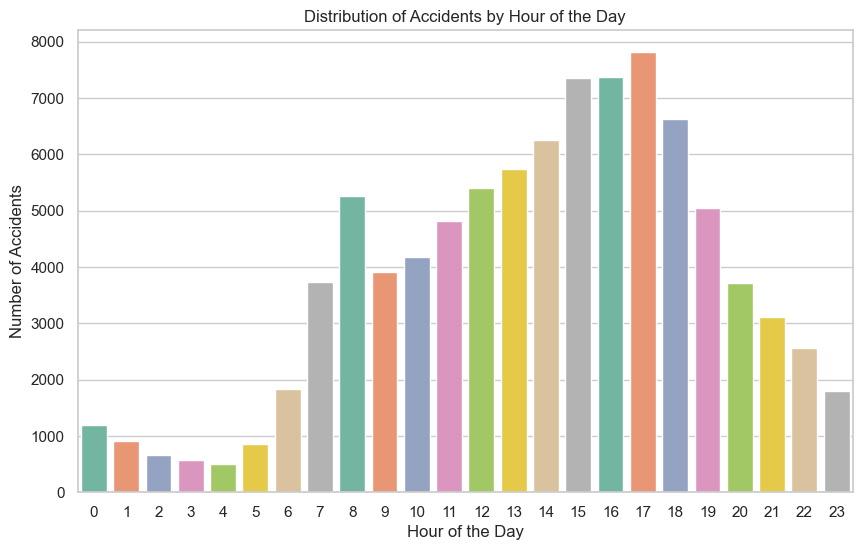

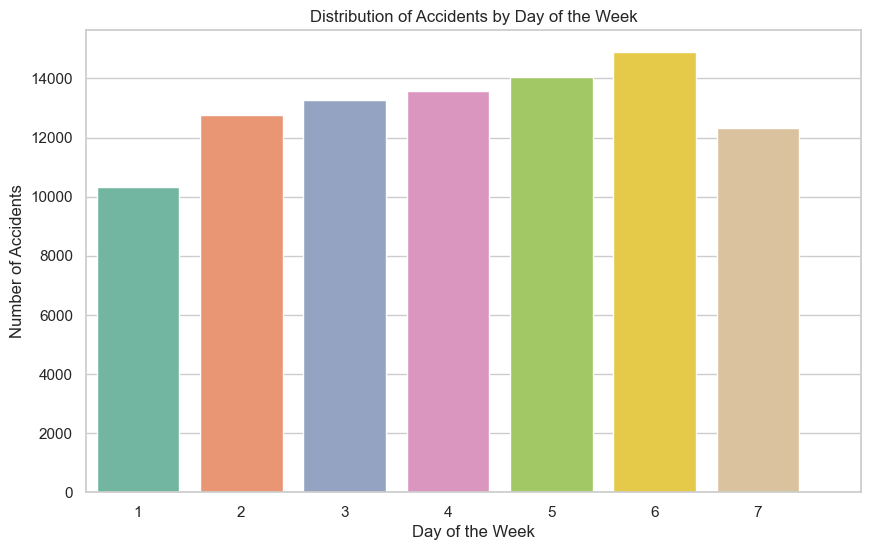

In [219]:
# Convert the 'date' and 'time' columns to datetime
df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y')
df['time'] = pd.to_datetime(df['time'], format='%H:%M')

# Extract the hour of the day from the 'time' column
df['Hour'] = df['time'].dt.hour

# Set Seaborn style and color palette
sns.set(style='whitegrid')
palette = sns.color_palette("Set2")

# Plotting the distribution of accidents by hour of the day
accidents_by_hour = df.groupby('Hour').size()

plt.figure(figsize=(10, 6))
sns.barplot(x=accidents_by_hour.index, y=accidents_by_hour.values, palette=palette)
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accidents by Hour of the Day')
plt.xticks(range(24))
plt.show()

# Plotting the distribution of accidents by day of the week
accidents_by_day = accident_df.groupby('day_of_week').size()

plt.figure(figsize=(10, 6))
sns.barplot(x=accidents_by_day.index, y=accidents_by_day.values, palette=palette)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accidents by Day of the Week')
plt.xticks(range(0, 8)) 
plt.show()


# QUESTION 2:  For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur? We suggest a focus on: Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.

ANSWER: 

- Peak accident hours, such as 8am and 5pm also occurs with motorbikes indicative of rush hours.
- Motorbike accidents exhibit a pronounced surge on Fridays and Saturdays for under 500cc as they are most time drunk-driving as it is the weekend and with high speed. Over 500cc occur on Sundays with more accidents.



C:\Users\HP 820 G3\anaconda3\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\HP 820 G3\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


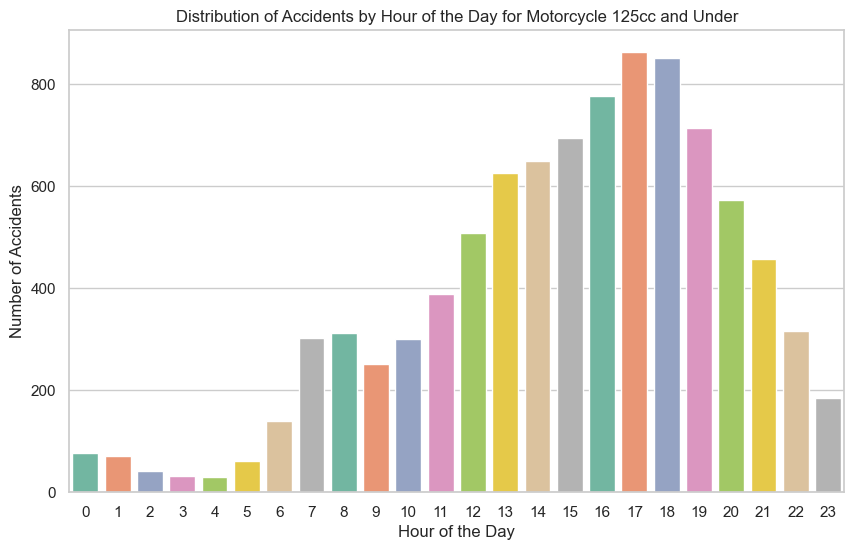

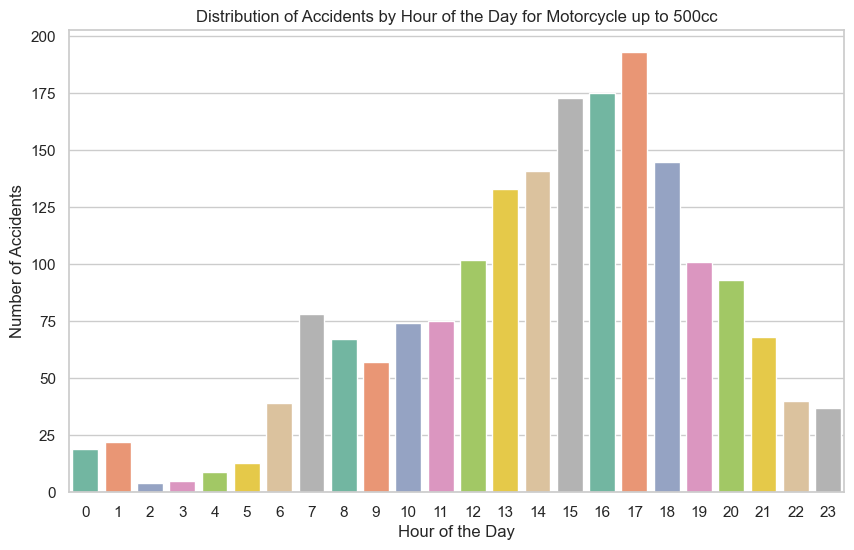

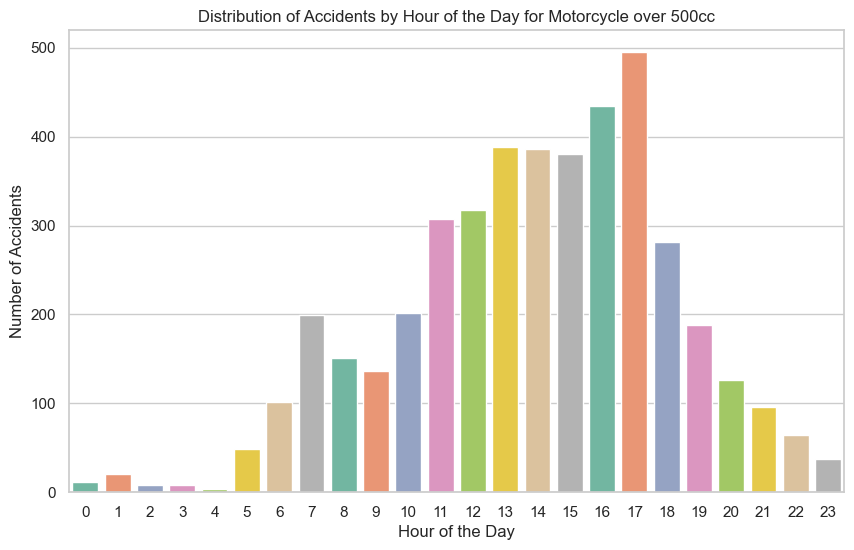

In [91]:
# Mapping the vehicle codes
motorcycle_125cc_under_df = df[df['vehicle_type'].isin([2, 3])]
motorcycle_up_to_500cc_df = df[df['vehicle_type'] == 4]
motorcycle_over_500cc_df = df[df['vehicle_type'] == 5]

# Convert the 'time' column to datetime
df['time'] = pd.to_datetime(df['time'], format='%H:%M')

# Extract the hour of the day from the 'time' column
df['Hour'] = df['time'].dt.hour

# Count the number of accidents for each hour of the day for each motorcycle category
accidents_by_hour_125cc_under = motorcycle_125cc_under_df['Hour'].value_counts().sort_index()
accidents_by_hour_up_to_500cc = motorcycle_up_to_500cc_df['Hour'].value_counts().sort_index()
accidents_by_hour_over_500cc = motorcycle_over_500cc_df['Hour'].value_counts().sort_index()

# Set Seaborn style and color palette
sns.set(style='whitegrid')
palette = sns.color_palette("Set2")

# Plotting the distribution of accidents by hour of the day for each motorcycle category
plt.figure(figsize=(10, 6))
sns.barplot(x=accidents_by_hour_125cc_under.index, y=accidents_by_hour_125cc_under.values, palette=palette)
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accidents by Hour of the Day for Motorcycle 125cc and Under')
plt.xticks(range(24))
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x=accidents_by_hour_up_to_500cc.index, y=accidents_by_hour_up_to_500cc.values, palette=palette)
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accidents by Hour of the Day for Motorcycle up to 500cc')
plt.xticks(range(24))
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x=accidents_by_hour_over_500cc.index, y=accidents_by_hour_over_500cc.values, palette=palette)
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accidents by Hour of the Day for Motorcycle over 500cc')
plt.xticks(range(24))
plt.show()


In [92]:
accident_df.columns

Index(['accident_index', 'accident_year', 'accident_reference',
       'location_easting_osgr', 'location_northing_osgr', 'longitude',
       'latitude', 'police_force', 'accident_severity', 'number_of_vehicles',
       'number_of_casualties', 'date', 'day_of_week', 'time',
       'local_authority_district', 'local_authority_ons_district',
       'local_authority_highway', 'first_road_class', 'first_road_number',
       'road_type', 'speed_limit', 'junction_detail', 'junction_control',
       'second_road_class', 'second_road_number',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag', 'lsoa_of_accident_location'],
      dtype='object')

C:\Users\HP 820 G3\anaconda3\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\HP 820 G3\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


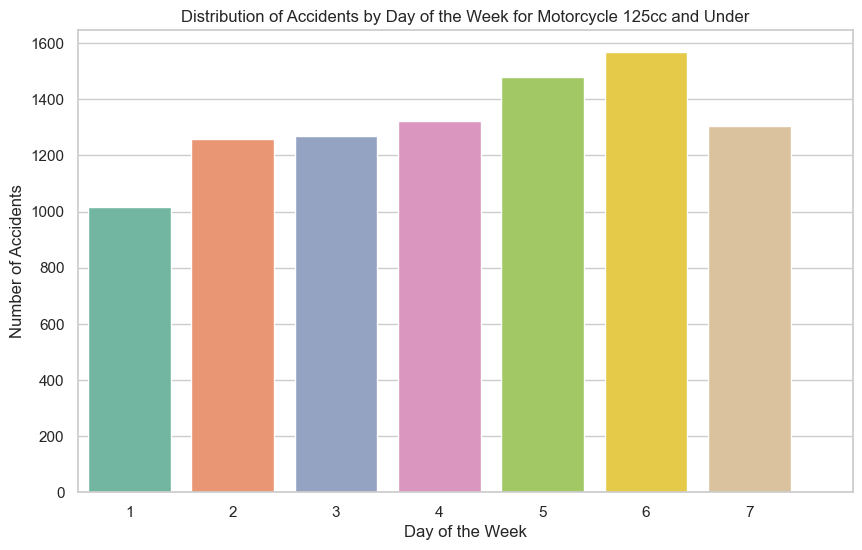

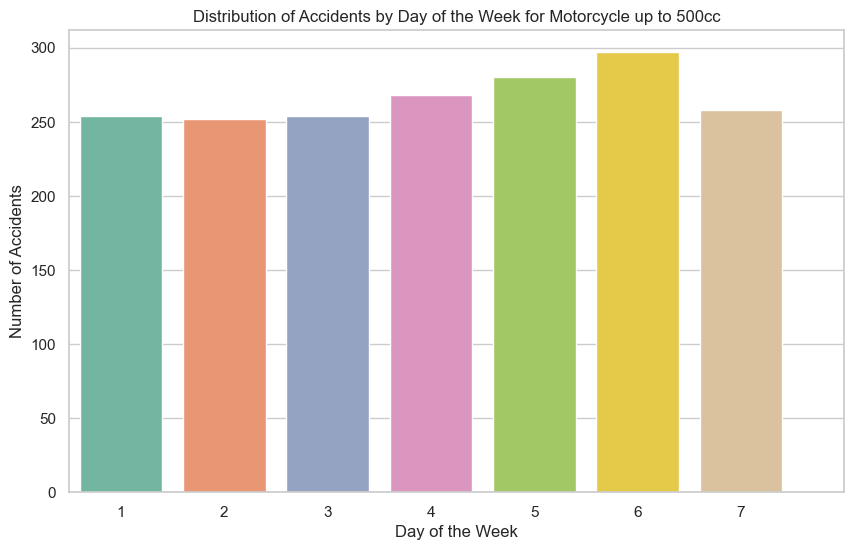

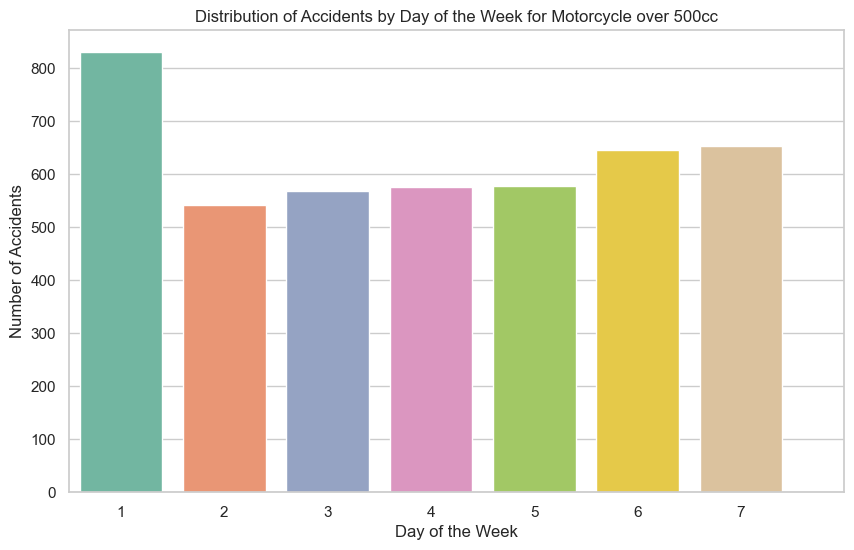

In [210]:
# Counting the number of accidents for each day of the week for each motorcycle category
accidents_by_day_of_week_125cc_under = motorcycle_125cc_under_df['day_of_week'].value_counts().sort_index()
accidents_by_day_of_week_up_to_500cc = motorcycle_up_to_500cc_df['day_of_week'].value_counts().sort_index()
accidents_by_day_of_week_over_500cc = motorcycle_over_500cc_df['day_of_week'].value_counts().sort_index()

# Setting Seaborn style and color palette
sns.set(style='whitegrid')
palette = sns.color_palette("Set2")

# Plotting the distribution of accidents by day of the week for each motorcycle category
plt.figure(figsize=(10, 6))
sns.barplot(x=accidents_by_day_of_week_125cc_under.index, y=accidents_by_day_of_week_125cc_under.values, palette=palette)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accidents by Day of the Week for Motorcycle 125cc and Under')
plt.xticks(range(0, 8))
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x=accidents_by_day_of_week_up_to_500cc.index, y=accidents_by_day_of_week_up_to_500cc.values, palette=palette)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accidents by Day of the Week for Motorcycle up to 500cc')
plt.xticks(range(0, 8))
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x=accidents_by_day_of_week_over_500cc.index, y=accidents_by_day_of_week_over_500cc.values, palette=palette)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accidents by Day of the Week for Motorcycle over 500cc')
plt.xticks(range(0, 8))
plt.show()


# QUESTION 3: For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?

ANSWER:
Plots below shows that most pedestrian accidents occurred during the weekday, with a higher number on Saturday around 8am and 3pm. 
The weekday high number is attributed to people walking to and from bus stops either to go to school or work would make up most of the casualties during this time. 
The high number on Saturday is attributed to people going for social activities. 

In [94]:
df['casualty_class'].unique()

array([3, 1, 2], dtype=int64)

C:\Users\HP 820 G3\anaconda3\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\HP 820 G3\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


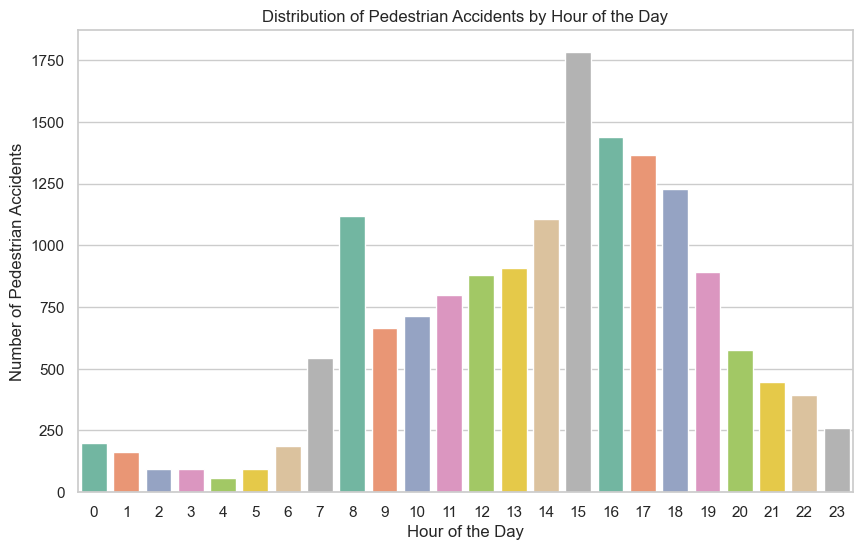

In [95]:
# Convert the 'date' and 'time' columns to datetime
df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y')
df['time'] = pd.to_datetime(df['time'], format='%H:%M')

# Extracting the hour of the day from the 'time' column
df['Hour'] = df['time'].dt.hour

# Filtering data for casualty_class equal to 3 : Pedestrian
pedestrian_df = df[df['casualty_class'] == 3]

# Setting Seaborn style and color palette
sns.set(style='whitegrid')
palette = sns.color_palette("Set2")

# Counting the number of pedestrian accidents for each hour of the day
pedestrian_accidents_by_hour = pedestrian_df.groupby('Hour').size()

plt.figure(figsize=(10, 6))
sns.barplot(x=pedestrian_accidents_by_hour.index, y=pedestrian_accidents_by_hour.values, palette=palette)
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Pedestrian Accidents')
plt.title('Distribution of Pedestrian Accidents by Hour of the Day')
plt.xticks(range(24))
plt.show()


C:\Users\HP 820 G3\anaconda3\lib\site-packages\seaborn\rcmod.py:400: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(mpl.__version__) >= "3.0":
C:\Users\HP 820 G3\anaconda3\lib\site-packages\setuptools\_distutils\version.py:346: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  other = LooseVersion(other)


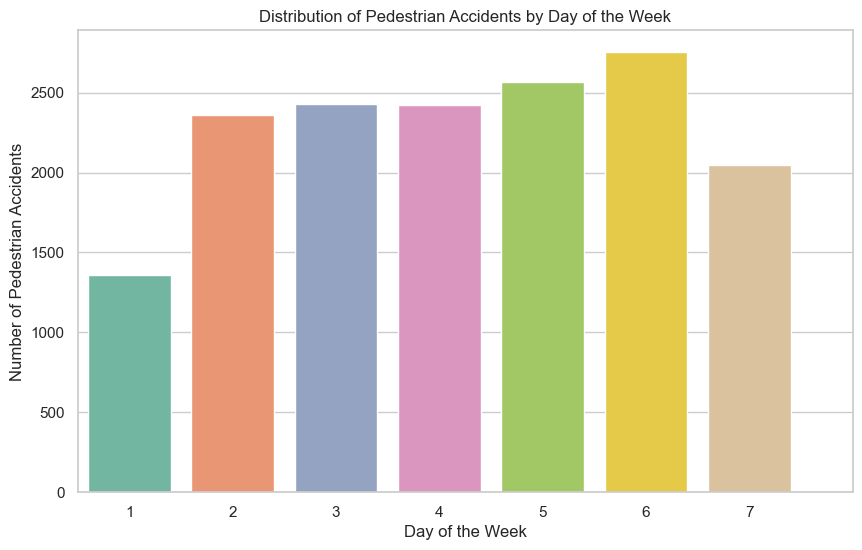

In [217]:
# Converting the 'date' and 'time' columns
df['date'] = pd.to_datetime(df['date'], format='%d/%m/%Y')
df['time'] = pd.to_datetime(df['time'], format='%H:%M')

# Filtering data for casualty_class equal to 3 (Pedestrian)
pedestrian_df = df[df['casualty_class'] == 3]

# Calculate the number of pedestrian accidents by day of the week
pedestrian_accidents_by_day = pedestrian_df['day_of_week'].value_counts().sort_index()

# Set Seaborn style and color palette
sns.set(style='whitegrid')
palette = sns.color_palette("Set2")

# Plotting the distribution of pedestrian accidents by day of the week
plt.figure(figsize=(10, 6))
sns.barplot(x=pedestrian_accidents_by_day.index, y=pedestrian_accidents_by_day.values, palette=palette)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Pedestrian Accidents')
plt.title('Distribution of Pedestrian Accidents by Day of the Week')
plt.xticks(range(0, 8))
plt.show()


In [ ]:
# Plotting the distribution of accidents by day of the week for each motorcycle category
plt.figure(figsize=(10, 6))
sns.barplot(x=accidents_by_day_of_week_125cc_under.index, y=accidents_by_day_of_week_125cc_under.values, palette=palette)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accidents by Day of the Week for Motorcycle 125cc and Under')
plt.xticks(range(0, 8))  
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x=accidents_by_day_of_week_up_to_500cc.index, y=accidents_by_day_of_week_up_to_500cc.values, palette=palette)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accidents by Day of the Week for Motorcycle up to 500cc')
plt.xticks(range(0, 8)) 
plt.show()

plt.figure(figsize=(10, 6))
sns.barplot(x=accidents_by_day_of_week_over_500cc.index, y=accidents_by_day_of_week_over_500cc.values, palette=palette)
plt.xlabel('Day of the Week')
plt.ylabel('Number of Accidents')
plt.title('Distribution of Accidents by Day of the Week for Motorcycle over 500cc')
plt.xticks(range(0, 8)) 
plt.show()


# Apriori Algorithm and Associate Pattern Mining

# QUESTION 4: Using the apriori algorithm, explore the impact of selected variables on accident severity.  

ANSWER:
This pattern suggests that in urban areas, there is a strong association between accidents with a speed limit of 30 and a slight level of accident severity. First, urban areas are typically more densely populated than other areas, hence many urban areas have a speed limit of 30. An accident severity that occurs at the moderate speed limit of 30 would be slight as against an occurrence at a higher speed limit. This association would most likely have fewer casualties.

In [98]:
#one-hot encoding the selected variables
apr1=pd.get_dummies(df['urban_or_rural_area'], prefix='Urban_or_Rural')
apr2=pd.get_dummies(df['speed_limit'], prefix='Speed_limit')
apr3=pd.get_dummies(df['accident_severity'], prefix='Accident_Sever')
apr4=pd.get_dummies(df['number_of_casualties'], prefix='Number_Casual')

aprlist=[apr1,apr2,apr3,apr4]
apr = pd.concat(aprlist, axis=1)
apr.head()

,Urban_or_Rural_1,Urban_or_Rural_2,Urban_or_Rural_3,Speed_limit_20,Speed_limit_30,Speed_limit_40,Speed_limit_50,Speed_limit_60,Speed_limit_70,Accident_Sever_1,...,Number_Casual_7,Number_Casual_8,Number_Casual_9,Number_Casual_10,Number_Casual_11,Number_Casual_12,Number_Casual_13,Number_Casual_17,Number_Casual_19,Number_Casual_41
0,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [209]:
# Apply Apriori algorithm to find frequent itemsets
frequent_itemsets = apriori(apm, min_support=0.2, use_colnames=True)

# Generate association rules based on frequent itemsets and lift metric
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=0.5)

# Sort the rules by lift in descending order
rules.sort_values(by="lift", ascending=False, inplace=True)

# Display the resulting association rules
display(rules)


C:\Users\HP 820 G3\anaconda3\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
42,"(Number_Casual_1, Urban_or_Rural_1)","(Accident_Sever_3, Speed_limit_30)",0.424842,0.439195,0.251875,0.592867,1.349894,0.065286,1.377449,0.450661
47,"(Accident_Sever_3, Speed_limit_30)","(Number_Casual_1, Urban_or_Rural_1)",0.439195,0.424842,0.251875,0.573491,1.349894,0.065286,1.348527,0.462195
45,"(Urban_or_Rural_1, Accident_Sever_3)","(Number_Casual_1, Speed_limit_30)",0.525701,0.355660,0.251875,0.479121,1.347131,0.064904,1.237024,0.543290
44,"(Number_Casual_1, Speed_limit_30)","(Urban_or_Rural_1, Accident_Sever_3)",0.355660,0.525701,0.251875,0.708189,1.347131,0.064904,1.625361,0.399916
49,(Urban_or_Rural_1),"(Number_Casual_1, Accident_Sever_3, Speed_limi...",0.642634,0.290975,0.251875,0.391941,1.346994,0.064885,1.166047,0.720847
40,"(Number_Casual_1, Accident_Sever_3, Speed_limi...",(Urban_or_Rural_1),0.290975,0.642634,0.251875,0.865624,1.346994,0.064885,2.659452,0.363325
24,(Urban_or_Rural_1),"(Number_Casual_1, Speed_limit_30)",0.642634,0.355660,0.306725,0.477294,1.341994,0.078166,1.232700,0.713106
21,"(Number_Casual_1, Speed_limit_30)",(Urban_or_Rural_1),0.355660,0.642634,0.306725,0.862411,1.341994,0.078166,2.597340,0.395506
17,(Urban_or_Rural_1),"(Accident_Sever_3, Speed_limit_30)",0.642634,0.439195,0.378542,0.589048,1.341199,0.096301,1.364649,0.711871
16,"(Accident_Sever_3, Speed_limit_30)",(Urban_or_Rural_1),0.439195,0.642634,0.378542,0.861900,1.341199,0.096301,2.587737,0.453631


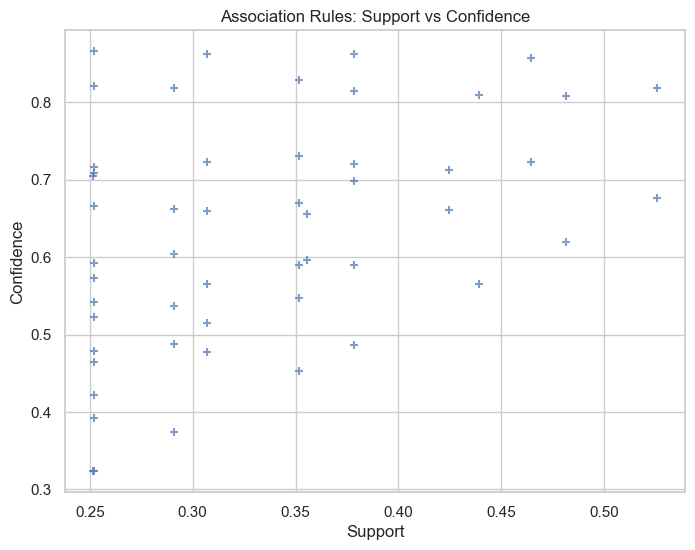

In [208]:
# Extracting support and confidence values from the rules df
support = rules['support'].to_numpy()
confidence = rules['confidence'].to_numpy()

# Create a scatter plot of support against confidence
plt.figure(figsize=(8, 6))    
plt.title('Association Rules: Support vs Confidence')
plt.xlabel('Support')
plt.ylabel('Confidence')
plt.scatter(x=support, y=confidence, marker="+", alpha=0.7)
plt.grid(True)

# Show the plot
plt.show()


In [221]:
# Filter association rules based on lift and confidence thresholds
ass_rules_filtered = rules[(rules['lift'] > 1) & (rules['confidence'] >= 0.5)]

selected_columns = {
    'antecedents': 'item_1',
    'consequents': 'item_2',
    'support': 'support',
    'confidence': 'confidence',
    'lift': 'lift'
}

# Creating the application pattern Df and sort by lift in descending order
app_pattern = ass_rules_filtered.rename(columns=selected_columns).sort_values(by=['lift'], ascending=False)

# Displaying the application pattern DataFrame
display(app_pattern)


,item_1,item_2,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
42,"(Number_Casual_1, Urban_or_Rural_1)","(Accident_Sever_3, Speed_limit_30)",0.424842,0.439195,0.251875,0.592867,1.349894,0.065286,1.377449,0.450661
47,"(Accident_Sever_3, Speed_limit_30)","(Number_Casual_1, Urban_or_Rural_1)",0.439195,0.424842,0.251875,0.573491,1.349894,0.065286,1.348527,0.462195
44,"(Number_Casual_1, Speed_limit_30)","(Urban_or_Rural_1, Accident_Sever_3)",0.355660,0.525701,0.251875,0.708189,1.347131,0.064904,1.625361,0.399916
40,"(Number_Casual_1, Accident_Sever_3, Speed_limi...",(Urban_or_Rural_1),0.290975,0.642634,0.251875,0.865624,1.346994,0.064885,2.659452,0.363325
21,"(Number_Casual_1, Speed_limit_30)",(Urban_or_Rural_1),0.355660,0.642634,0.306725,0.862411,1.341994,0.078166,2.597340,0.395506
17,(Urban_or_Rural_1),"(Accident_Sever_3, Speed_limit_30)",0.642634,0.439195,0.378542,0.589048,1.341199,0.096301,1.364649,0.711871
16,"(Accident_Sever_3, Speed_limit_30)",(Urban_or_Rural_1),0.439195,0.642634,0.378542,0.861900,1.341199,0.096301,2.587737,0.453631
1,(Speed_limit_30),(Urban_or_Rural_1),0.542641,0.642634,0.464727,0.856417,1.332667,0.116007,2.488912,0.545796
0,(Urban_or_Rural_1),(Speed_limit_30),0.642634,0.542641,0.464727,0.723159,1.332667,0.116007,1.652066,0.698513
20,"(Number_Casual_1, Urban_or_Rural_1)",(Speed_limit_30),0.424842,0.542641,0.306725,0.721975,1.330485,0.076189,1.645032,0.431872


# QUESTION 5: Identify accidents in our region: Kingston upon Hull, Humberside, and the East Riding of Yorkshire etc. You can do this by filtering on LSOA, or police region or another method if you can find one. Run clustering on this data. What do these clusters reveal about the distribution of accidents in our region? 

ANSWER: 
Weather conditions: Some weather conditions, such as fog and mist around Humber Region can make it more difficult to drive safely.
Road conditions: Some roads may be more dangerous than others due to intersections, or high traffic volumes.
Urban or Rural Area: Accidents are prone to happen more in urban areas with dense population and a lot of vehicles

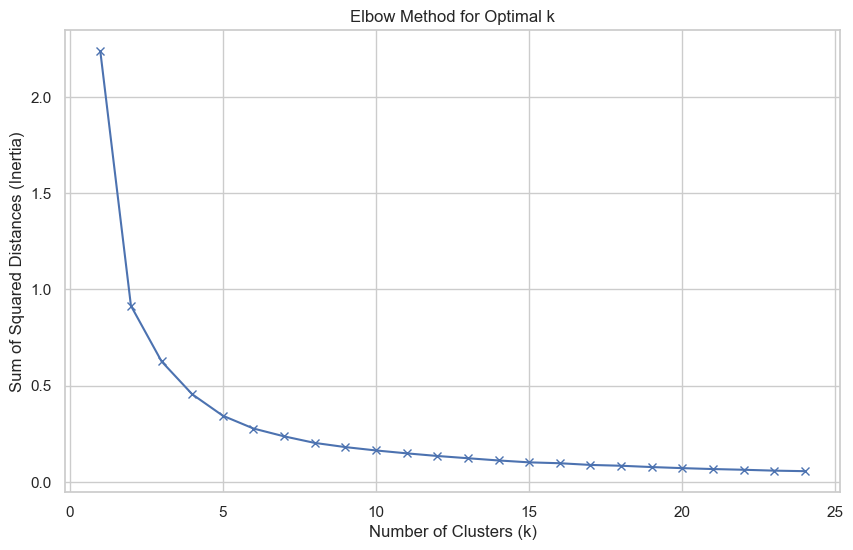

In [194]:
# Filter the data
accidents_in_region_df = df[df['local_authority_ons_district'] == 'E06000010']

# Selecting longitude and latitude
cldf = accidents_in_region_df[['longitude', 'latitude']]

# Running K-means clustering for different values of k
inertia_values = []
K = range(1, 25)  # Try different values of k from 1 to 10
for k in K:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(cldf)
    inertia_values.append(kmeans.inertia_)

# Plot the inertia values for different values of k
plt.figure(figsize=(10, 6))
plt.plot(K, inertia_values, 'bx-')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Sum of Squared Distances (Inertia)')
plt.title('Elbow Method for Optimal k')
plt.show()


# Website Guide/Reference:
https://geopandas.org/en/stable/

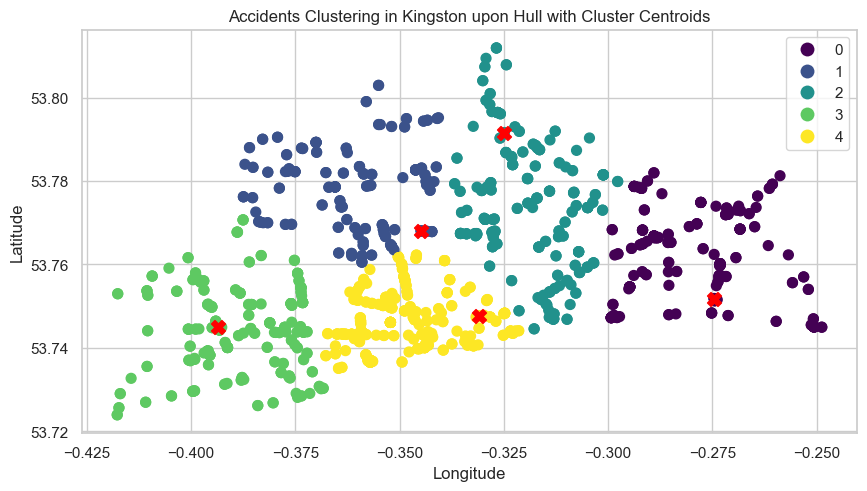

In [195]:
# Filter the data to include accidents in Kingston upon hull
accidents_in_region_df = df[df['local_authority_ons_district'] == 'E06000010']

# Select relevant features for clustering (longitude and latitude)
cldf = accidents_in_region_df[['longitude', 'latitude']]

# Run K-means clustering with 5 clusters
kmeans = KMeans(n_clusters=5)
labels = kmeans.fit_predict(cldf)
cldf['cluster'] = labels 

# Create a GeoDataFrame from the DataFrame with longitude, latitude, and cluster labels
gdf = gpd.GeoDataFrame(cldf, geometry=gpd.points_from_xy(cldf.longitude, cldf.latitude))

# Calculate cluster centroids
cluster_centroids = gdf.groupby('cluster').apply(lambda x: x.geometry.centroid.iloc[0])
centroids_gdf = gpd.GeoDataFrame(geometry=cluster_centroids, crs=gdf.crs)

# Create a new figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the clusters using different colors for each cluster
gdf.plot(column='cluster', categorical=True, legend=True, markersize=50, cmap='viridis', ax=ax)

# Plot the cluster centroids as red 'X' markers
centroids_gdf.plot(ax=ax, color='red', marker='X', markersize=100)

# Set the title and labels
ax.set_title('Accidents Clustering in Kingston upon Hull with Cluster Centroids')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()


# Reference:
https://python-visualization.github.io/folium/modules.html

# Kingston Upon Hull Map Representation Of Clusters

In [196]:
# Filter the data to include accidents in Kingston upon Hull
accidents_in_region_df = df[df['local_authority_ons_district'] == 'E06000010']

# Select relevant features for clustering (longitude and latitude)
cldf = accidents_in_region_df[['longitude', 'latitude']]

# Run K-means clustering with 5 clusters
kmeans = KMeans(n_clusters=5)
labels = kmeans.fit_predict(cldf)

# Add the cluster labels to the cldf DataFrame
cldf['cluster'] = labels

# Get the cluster centroids
centroids = kmeans.cluster_centers_

# Create a map centered on Kingston upon Hull
map_clus = folium.Map(location=[53.767570, -0.327416], zoom_start=12)

# Define the colormap from 'viridis' with the number of unique clusters
colormap = plt.cm.get_cmap('viridis', len(np.unique(labels)))

# Create a MarkerCluster to group the markers for each cluster
marker_cluster = MarkerCluster().add_to(map_clus)

# Add cluster centroids as markers on the map
for index, row in cldf.iterrows():
    cluster_color = colormap(row['cluster'])  # Get the color based on the cluster label
    cluster_color_hex = "#{:02x}{:02x}{:02x}".format(int(cluster_color[0] * 255), int(cluster_color[1] * 255), int(cluster_color[2] * 255))
    folium.Marker(location=[row['latitude'], row['longitude']],
                  popup=f"Cluster: {row['cluster']}",
                  icon=folium.Icon(color=cluster_color_hex)).add_to(marker_cluster)



In [197]:
map_clus

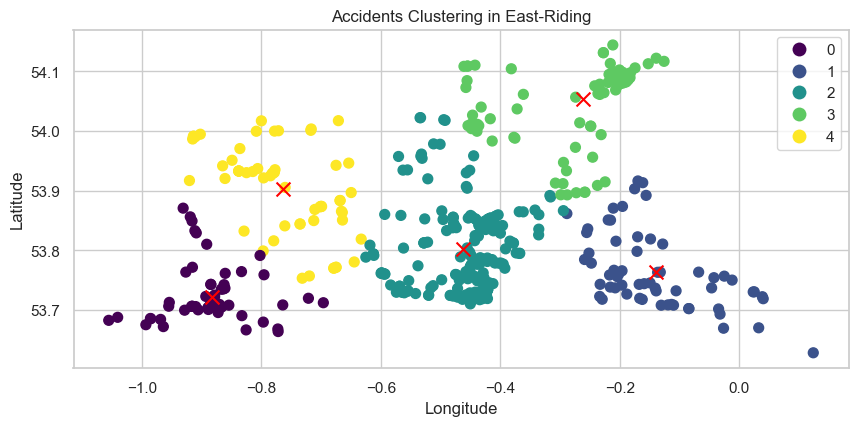

In [199]:
# Filter the data to include accidents in the East Riding of yorkshire
accidents_in_eastriding = accident_df[accident_df['local_authority_ons_district'] == 'E06000011']

# Select relevant features for clustering (longitude and latitude)
east_df = accidents_in_eastriding[['longitude', 'latitude']]

# Run K-means clustering with 5 clusters
kmeans = KMeans(n_clusters=5)
labels = kmeans.fit_predict(east_df)
centroids = kmeans.cluster_centers_

# Add the cluster labels to the DataFrame
east_df['cluster'] = labels

# Create a GeoDataFrame from the DataFrame with longitude, latitude, and cluster labels
gdf = gpd.GeoDataFrame(east_df, geometry=gpd.points_from_xy(east_df.longitude, east_df.latitude))

# Create a new figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the clusters using different colors for each cluster
gdf.plot(column='cluster', categorical=True, legend=True, markersize=50, cmap='viridis', ax=ax)

# Plot the cluster centroids
ax.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='x', s=100, label='Cluster Centroids')

# Set the title and labels
ax.set_title('Accidents Clustering in East-Riding')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()


# East Riding of Yorkshire Map Representation Of Clusters

In [200]:
# Filter the data to include accidents in East Riding of yorkshire
accidents_in_region_df = df[df['local_authority_ons_district'] == 'E06000011']

# Select relevant features for clustering (longitude and latitude)
cldf = accidents_in_region_df[['longitude', 'latitude']]

# Run K-means clustering with 5 clusters
kmeans = KMeans(n_clusters=5)
labels = kmeans.fit_predict(cldf)

# Add the cluster labels to the cldf DataFrame
cldf['cluster'] = labels

# Get the cluster centroids
centroids = kmeans.cluster_centers_

# Create a map centered on Kingston upon Hull
map_clus = folium.Map(location=[53.831, -0.429], zoom_start=12)

# Define the colormap from 'viridis' with the number of unique clusters
colormap = plt.cm.get_cmap('viridis', len(np.unique(labels)))

# Create a MarkerCluster to group the markers for each cluster
marker_cluster = MarkerCluster().add_to(map_clus)

# Add cluster centroids as markers on the map
for index, row in cldf.iterrows():
    cluster_colr = colormap(row['cluster'])  # Get the color based on the cluster label
    cluster_color_he = "#{:02x}{:02x}{:02x}".format(int(cluster_colr[0] * 255), int(cluster_colr[1] * 255), int(cluster_colr[2] * 255))
    folium.Marker(location=[row['latitude'], row['longitude']],
                  popup=f"Cluster: {row['cluster']}",
                  icon=folium.Icon(color=cluster_color_he)).add_to(marker_cluster)



In [201]:
map_clus

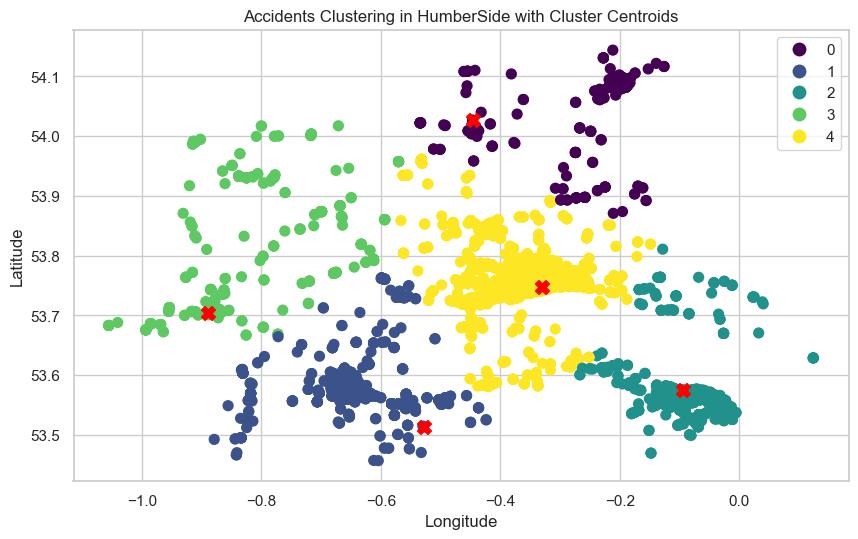

In [202]:
# Filter the data for accident in humberside
accidents_in_humberside = df[df['police_force'] == 16]

# Selecting longitude and latitude
humber_df = accidents_in_humberside[['longitude', 'latitude']]

# Run K-means clustering with 5 clusters
kmeans = KMeans(n_clusters=5)
kmeans.fit(humber_df)

# Get the cluster labels and centroids
labels = kmeans.predict(humber_df)
centroids = kmeans.cluster_centers_

# Add cluster labels to the DataFrame
accidents_in_humberside['cluster'] = labels

# Create a GeoDataFrame from the DataFrame with longitude, latitude, and cluster labels
hgdf = gpd.GeoDataFrame(accidents_in_humberside, geometry=gpd.points_from_xy(humber_df.longitude, humber_df.latitude))

# Calculate cluster centroids
cluster_centroids = hgdf.groupby('cluster').apply(lambda x: x.geometry.centroid.iloc[0])
centroids_gdf = gpd.GeoDataFrame(geometry=cluster_centroids, crs=hgdf.crs)

# Create a new figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the clusters using different colorsr
hgdf.plot(column='cluster', categorical=True, legend=True, markersize=50, cmap='viridis', ax=ax)

# Plot the cluster centroids as red 'X' markers
centroids_gdf.plot(ax=ax, color='red', marker='X', markersize=100)

# Set the title and labels
ax.set_title('Accidents Clustering in HumberSide with Cluster Centroids')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

# Show the plot
plt.show()


In [203]:
# Filtering the data
accidents_in_humberside = df[df['police_force'] == 16]

# Selecting longitude and latitude
humber_df = accidents_in_humberside[['longitude', 'latitude']]

# K-means clustering with 5 clusters 
kmeans = KMeans(n_clusters=5)
kmeans.fit(humber_df)

# cluster labels
labels = kmeans.predict(humber_df)

# Adding cluster labels to the df
humber_df['cluster'] = labels

# Creating a GeoDataFrame from the df with longitude, latitude, and cluster labels
hgdf = gpd.GeoDataFrame(humber_df, geometry=gpd.points_from_xy(humber_df.longitude, humber_df.latitude))

# Create a map centered on Humberside
map_clus = folium.Map(location=[53.683, -0.435], zoom_start=10)

# Define the colormap from 'viridis'
colormap = plt.cm.get_cmap('viridis', len(np.unique(labels)))

# Creating a MarkerCluster to group the markers for each cluster
marker_cluster = MarkerCluster().add_to(map_clus)

# Adding cluster centroids as markers on the map
for index, row in hgdf.iterrows():
    clust_color = colormap(row['cluster']) #this will get the color based on the label
    clust_color_h = "#{:02x}{:02x}{:02x}".format(int(clust_color[0] * 255), int(clust_color[1] * 255), int(clust_color[2] * 255))
    folium.Marker(location=[row['latitude'], row['longitude']],
                  popup=f"Cluster: {row['cluster']}",
                  icon=folium.Icon(color=clust_color_h)).add_to(marker_cluster)



In [204]:
map_clus

# Outlier Detection, Visualization and Handling Using Isolated Forest, Grubb's Test and Scatter Plots

# Question 6: Using outlier detection methods, identify unusual entries in your data set. Should you keep these entries in your data? 

ANSWER: Data points showed where drivers below the age of 16years drove cars, trucks, and were involved in accidents. The age for driving is 17 years and for a person to drive at age 16 years, he must have obtained PIP (Gov.uk). Hence, this motivated my decision to leave the data of 16 years old drivers.  Those below 16 years were dropped as it is not possible for Driver’s license to be issued to an underage. Some were as low as age 10years old driving a Ford Fiesta car. There are some drivers up to 100 years old but would not be removed. Drivers above 70 years can renew their driver’s license every three years (Gov.uk).

ANSWER: An entry for engine capacity of Ford Fiesta was above 17500 cc. There was also a Vauxhall vehicle of above 17500 cc. The average engine capacity cc of Vauxhall is 2275cc (Enginert.com). Also, the engine capacity cc of Ford Fiesta falls within 999 cc and 1596 cc (Cars-Data.com). The entry of 17500 cc is significantly higher than the expected engine capacity for these models. Instead of dropping this data, it would be imputed with the mode engine capacity cc of other ford fiesta cars and Vauxhall car respectively.



Outlier Rows:
       accident_index  accident_year_x accident_reference_x  \
0       2020010219808             2020            010219808   
29      2020010228031             2020            010228031   
30      2020010228031             2020            010228031   
31      2020010228031             2020            010228031   
32      2020010228031             2020            010228031   
...               ...              ...                  ...   
220419  2020991023880             2020            991023880   
220425  2020991024209             2020            991024209   
220426  2020991024526             2020            991024526   
220429  2020991029573             2020            991029573   
220434  2020991032575             2020            991032575   

        location_easting_osgr  location_northing_osgr  longitude   latitude  \
0                    521389.0                175144.0  -0.254001  51.462262   
29                   553943.0                190802.0   0.221108  51.59

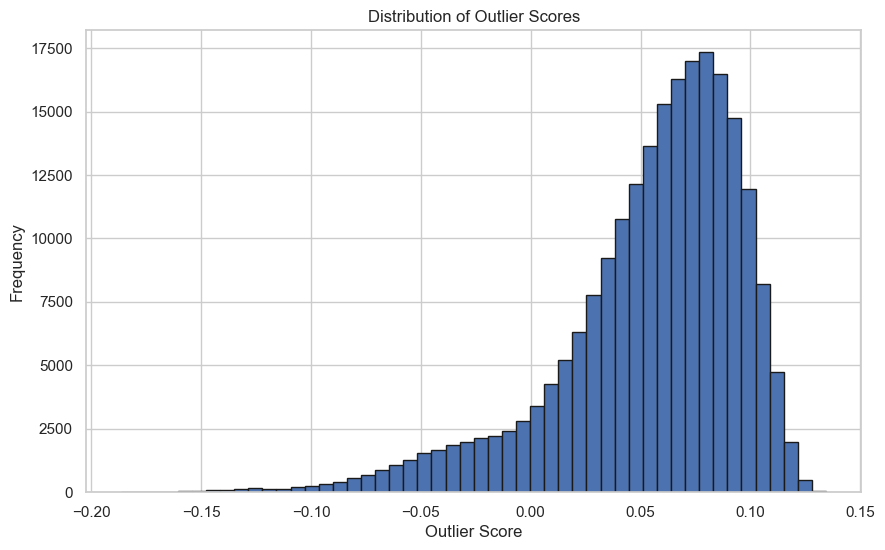

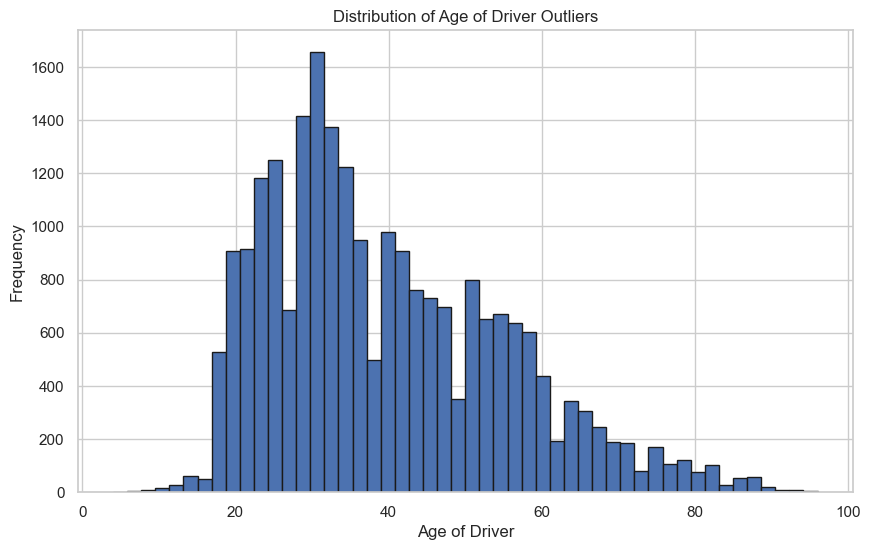

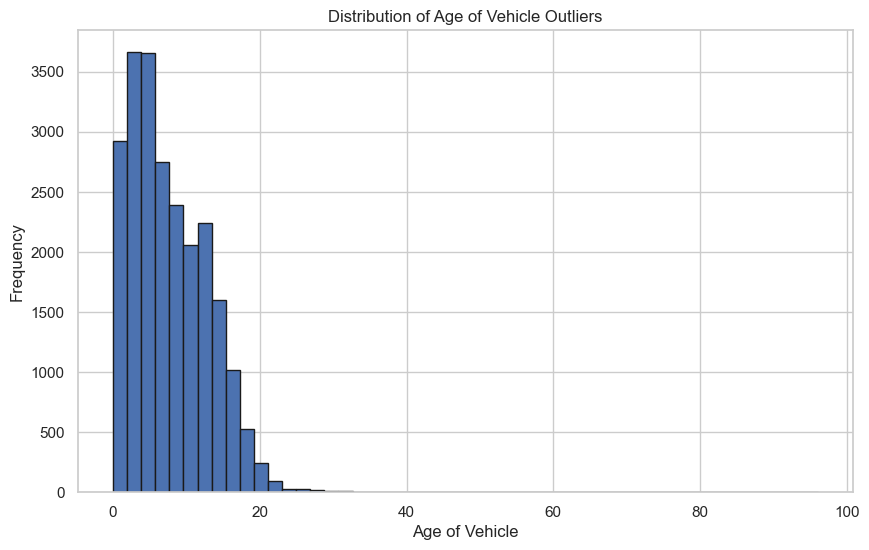

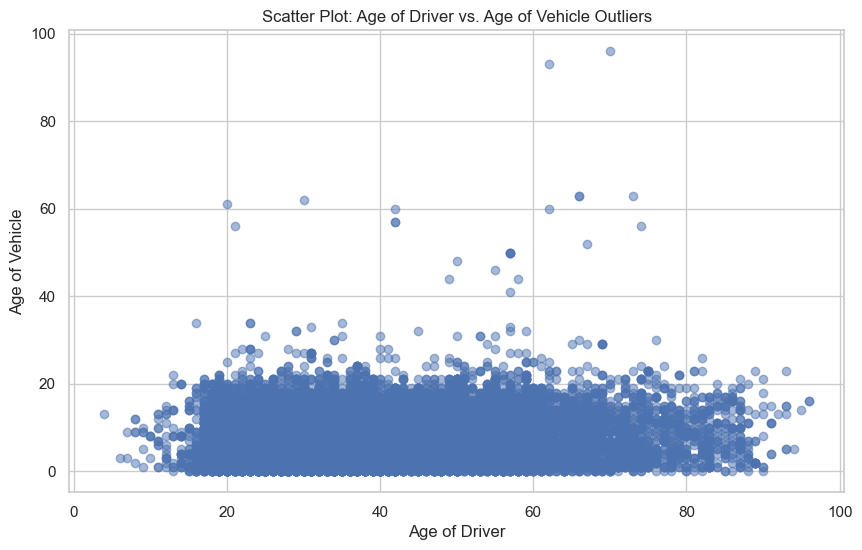

In [104]:
# Select numerical features
numerical_features = df.select_dtypes(include=['float64', 'int64'])

# Scale the numerical features
scaler = StandardScaler()
scaled_numerical = scaler.fit_transform(numerical_features)

# Initialize the Isolation Forest model
iso_forest = IsolationForest(contamination='auto', random_state=42)

# Fit the model and predict outliers
outlier_predictions = iso_forest.fit_predict(scaled_numerical)

# Create a DataFrame with the original data and the outlier label
outlier_df = df.copy()
outlier_df['Outlier'] = outlier_predictions == -1

# Print the rows that are identified as outliers
outlier_rows = outlier_df[outlier_df['Outlier']]
print("Outlier Rows:")
print(outlier_rows)

# Visualize the outlier scores
outlier_scores = iso_forest.decision_function(scaled_numerical)
plt.figure(figsize=(10, 6))
plt.hist(outlier_scores, bins=50, edgecolor='k')
plt.xlabel('Outlier Score')
plt.ylabel('Frequency')
plt.title('Distribution of Outlier Scores')
plt.show()

# Visualize Age of Driver Outliers
plt.figure(figsize=(10, 6))
plt.hist(df[outlier_df['Outlier']]['age_of_driver'], bins=50, edgecolor='k')
plt.xlabel('Age of Driver')
plt.ylabel('Frequency')
plt.title('Distribution of Age of Driver Outliers')
plt.show()

# Visualize Age of Vehicle Outliers
plt.figure(figsize=(10, 6))
plt.hist(df[outlier_df['Outlier']]['age_of_vehicle'], bins=50, edgecolor='k')
plt.xlabel('Age of Vehicle')
plt.ylabel('Frequency')
plt.title('Distribution of Age of Vehicle Outliers')
plt.show()

# Scatter Plot for Age of Driver vs. Age of Vehicle Outliers
plt.figure(figsize=(10, 6))
plt.scatter(df[outlier_df['Outlier']]['age_of_driver'], df[outlier_df['Outlier']]['age_of_vehicle'], alpha=0.5)
plt.xlabel('Age of Driver')
plt.ylabel('Age of Vehicle')
plt.title('Scatter Plot: Age of Driver vs. Age of Vehicle Outliers')
plt.show()


In [106]:
print(df['age_of_vehicle'].skew())

1.0383509915456908


In [107]:
df['age_of_vehicle'].describe()

count    220435.000000
mean          8.181396
std           5.594858
min           0.000000
25%           4.000000
50%           7.000000
75%          12.000000
max          96.000000
Name: age_of_vehicle, dtype: float64

In [108]:
# Find the indices of rows where 'age_of_vehicle' > 80
outlier_indices = np.where(df['age_of_vehicle'] >= 78)[0]

# Drop the rows with outlier indices
df = df.drop(index=outlier_indices)

# Reset the index of the DataFrame
df = df.reset_index(drop=True)

In [109]:
print(df['age_of_vehicle'].skew())

0.9073851620714615


In [116]:
print(df['age_of_driver'].skew())

0.6400933305961239


<AxesSubplot:xlabel='age_of_driver'>

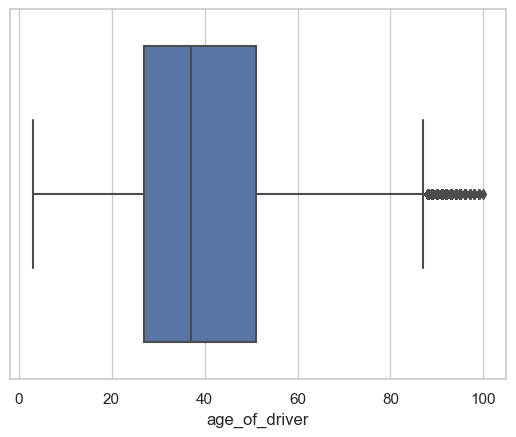

In [117]:
sns.boxplot(df['age_of_driver'])

In [121]:
print(np.where(df['age_of_driver']<10))

(array([  2367,   3551,   3770,   3771,   3772,  12349,  12566,  14023,
        14883,  14988,  15426,  15555,  15556,  18083,  20543,  20949,
        21365,  21366,  21447,  22732,  23030,  23761,  23762,  24214,
        28346,  28788,  28945,  29818,  29938,  29939,  29941,  31111,
        31925,  35932,  40554,  44084,  46259,  46614,  46996,  47129,
        47540,  48442,  49552,  49577,  49839,  49959,  50103,  50206,
        51094,  51102,  51591,  51987,  53493,  55495,  55605,  56189,
        56190,  56191,  56350,  56405,  56411,  56422,  56423,  56424,
        56460,  56620,  56934,  57842,  58165,  58664,  58800,  59051,
        60292,  61218,  61938,  62279,  62410,  64267,  64675,  65226,
        65227,  65450,  65494,  65727,  65728,  65895,  65896,  65927,
        65931,  68151,  68272,  68306,  69162,  69232,  69253,  69966,
        70186,  70760,  70933,  72060,  72358,  74123,  77813,  78067,
        78068,  78487,  78499,  78512,  78829,  79392,  79553,  79609,
     

In [122]:
# Filter the DataFrame based on the condition that they dont ride bicycles
filtered_indices = df[(df['age_of_driver'] < 16) & (df['vehicle_type'] != 1)].index

# Drop the filtered rows from the original DataFrame
df.drop(filtered_indices, inplace=True)

# Reset the index of the DataFrame
df = df.reset_index(drop=True)

# Display the updated DataFrame
print(df)


       accident_index  accident_year_x  location_easting_osgr  \
0       2020010219808             2020               521389.0   
1       2020010220496             2020               529337.0   
2       2020010220496             2020               529337.0   
3       2020010228005             2020               526432.0   
4       2020010228006             2020               538676.0   
...               ...              ...                    ...   
219866  2020991030297             2020               383664.0   
219867  2020991030297             2020               383664.0   
219868  2020991030900             2020               277161.0   
219869  2020991030900             2020               277161.0   
219870  2020991032575             2020               240402.0   

        location_northing_osgr  longitude   latitude  police_force  \
0                     175144.0  -0.254001  51.462262             1   
1                     176237.0  -0.139253  51.470327             1   
2        

In [123]:
print(df['age_of_driver'].skew())

0.6458524797466002


Potential Outliers for 'age_of_driver':
       accident_index  accident_year_x  location_easting_osgr  \
2172    2020010231441             2020               537904.0   
2476    2020010231896             2020               532876.0   
2935    2020010232619             2020               535519.0   
2936    2020010232619             2020               535519.0   
2937    2020010232619             2020               535519.0   
...               ...              ...                    ...   
216087  2020990972908             2020               288066.0   
216789  2020990978759             2020               334194.0   
217986  2020990991630             2020               261165.0   
219099  2020991004453             2020               389828.0   
219109  2020991004522             2020               356722.0   

        location_northing_osgr  longitude   latitude  police_force  \
2172                  195369.0  -0.008491  51.640225             1   
2476                  196766.0  -0.0805

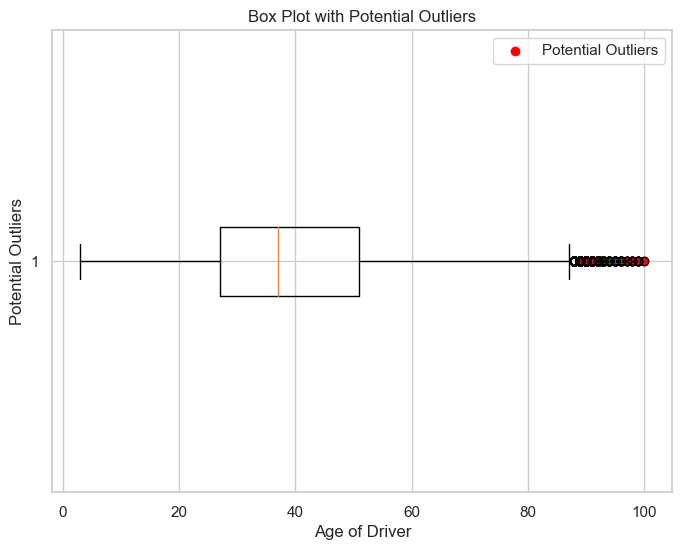

In [125]:
#using function for Grubb's Test
def detect_outliers_zscore(data, column_name, threshold=3):
    """
    Detect potential outliers using Z-score method.
    
    Parameters:
    - data: DataFrame containing the data.
    - column_name: Name of the column to analyze.
    - threshold: Z-score threshold for outlier detection.
    
    Returns:
    - DataFrame containing potential outliers.
    """
    column_data = data[column_name]
    
    # Calculating Z-scores
    z_scores = np.abs((column_data - column_data.mean()) / column_data.std())
    
    # Identifying potential outliers based on the threshold
    potential_outliers = data[z_scores > threshold]
    
    return potential_outliers

# Caling the function to detect potential outliers for 'age_of_driver'
potential_outliers_age = detect_outliers_zscore(df, 'age_of_driver', threshold=3)

# Display the potential outliers for 'age_of_driver'
print("Potential Outliers for 'age_of_driver':")
print(potential_outliers_age)

# Create a box plot with potential outliers
plt.figure(figsize=(8, 6))
plt.boxplot(df['age_of_driver'], vert=False)
plt.scatter(potential_outliers_age['age_of_driver'], [1] * len(potential_outliers_age), color='red', label='Potential Outliers')
plt.xlabel('Age of Driver')
plt.ylabel('Potential Outliers')
plt.title('Box Plot with Potential Outliers')
plt.legend()
plt.show()


<AxesSubplot:xlabel='engine_capacity_cc'>

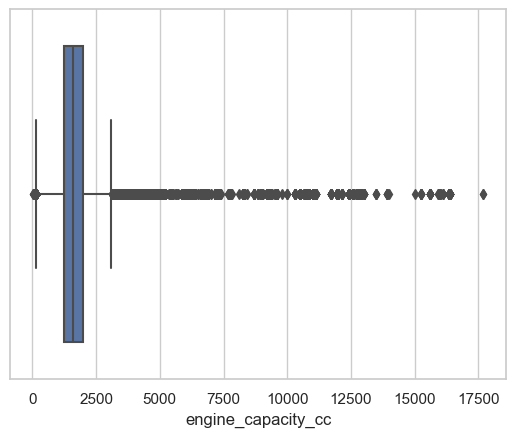

In [130]:
sns.boxplot(df['engine_capacity_cc'])

In [131]:
# Finding the indices of rows where engine_capacity_cc > 17500
outlier_indices = np.where(df['engine_capacity_cc'] >=17500)[0]


In [132]:
outlier_indices

array([133789, 133790], dtype=int64)

In [133]:
df.loc[133789]

accident_index              2020361015654
accident_year_x                      2020
location_easting_osgr            620626.0
location_northing_osgr           312752.0
longitude                        1.261461
                               ...       
age_of_vehicle                         15
generic_make_model        VAUXHALL VECTRA
driver_imd_decile                      10
driver_home_area_type                   2
Hour                                   18
Name: 133789, Length: 78, dtype: object

In [134]:
# Calculate the mode of 'engine_capacity_cc' for 'VAUXHALL VECTRA'
mode_engine_capacity = df[df['generic_make_model'] == 'VAUXHALL VECTRA']['engine_capacity_cc'].mode()[0]

# Finding the index of the row
index_to_replace = 133789

# Update the value in the specific row
df.at[index_to_replace, 'engine_capacity_cc'] = mode_engine_capacity

# Printing the updated DataFrame
print(df)


       accident_index  accident_year_x  location_easting_osgr  \
0       2020010219808             2020               521389.0   
1       2020010220496             2020               529337.0   
2       2020010220496             2020               529337.0   
3       2020010228005             2020               526432.0   
4       2020010228006             2020               538676.0   
...               ...              ...                    ...   
219866  2020991030297             2020               383664.0   
219867  2020991030297             2020               383664.0   
219868  2020991030900             2020               277161.0   
219869  2020991030900             2020               277161.0   
219870  2020991032575             2020               240402.0   

        location_northing_osgr  longitude   latitude  police_force  \
0                     175144.0  -0.254001  51.462262             1   
1                     176237.0  -0.139253  51.470327             1   
2        

In [137]:
# Calculating the mode of 'engine_capacity_cc' for 'FORD FIESTA'
mode_engine_capacity = df[df['generic_make_model'] == 'FORD FIESTA']['engine_capacity_cc'].mode()[0]

# Finding the index of the row
index_to_replace = 133790

# Update the value in the specific row
df.at[index_to_replace, 'engine_capacity_cc'] = mode_engine_capacity

# Printing the updated DataFrame
print(df)

       accident_index  accident_year_x  location_easting_osgr  \
0       2020010219808             2020               521389.0   
1       2020010220496             2020               529337.0   
2       2020010220496             2020               529337.0   
3       2020010228005             2020               526432.0   
4       2020010228006             2020               538676.0   
...               ...              ...                    ...   
219866  2020991030297             2020               383664.0   
219867  2020991030297             2020               383664.0   
219868  2020991030900             2020               277161.0   
219869  2020991030900             2020               277161.0   
219870  2020991032575             2020               240402.0   

        location_northing_osgr  longitude   latitude  police_force  \
0                     175144.0  -0.254001  51.462262             1   
1                     176237.0  -0.139253  51.470327             1   
2        

In [136]:
df.loc[133789]['engine_capacity_cc']

1796

In [206]:
df.loc[133790]['engine_capacity_cc']

125

In [138]:
print(df['engine_capacity_cc'].skew())

4.9082136467554305


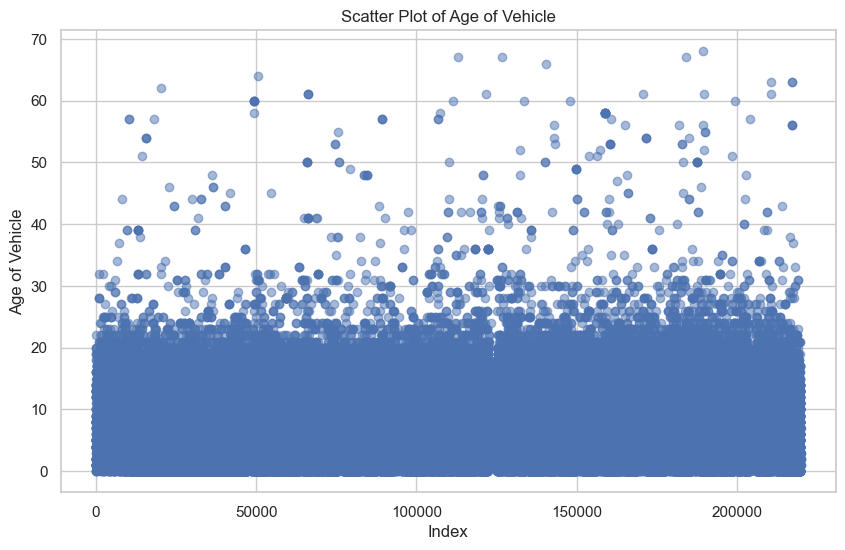

In [192]:
# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(range(len(df['age_of_vehicle'])), df['age_of_vehicle'], alpha=0.5)
plt.title('Scatter Plot of Age of Vehicle')
plt.xlabel('Index')
plt.ylabel('Age of Vehicle')
plt.show()

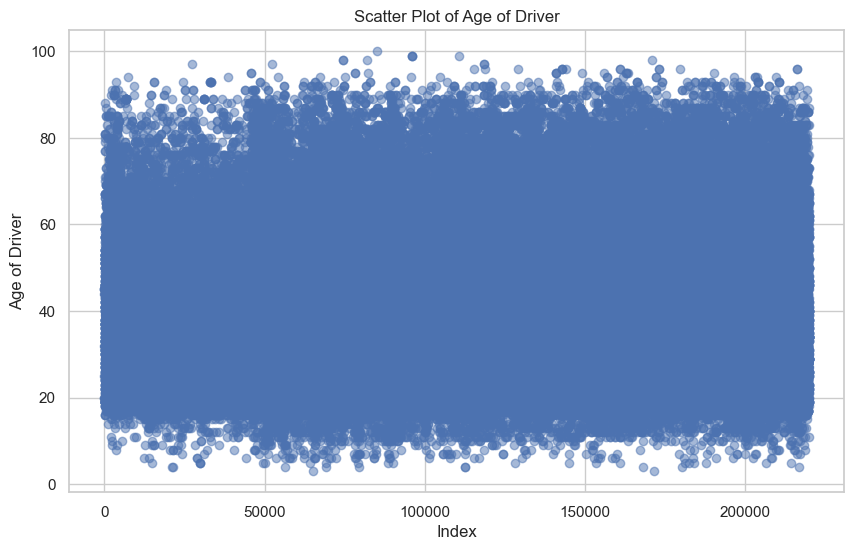

In [193]:
# Creating a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(range(len(df['age_of_driver'])), df['age_of_driver'], alpha=0.5)
plt.title('Scatter Plot of Age of Driver')
plt.xlabel('Index')
plt.ylabel('Age of Driver')
plt.show()

Outlier Rows:
       accident_index  accident_year_x  location_easting_osgr  \
0       2020010219808             2020               521389.0   
29      2020010228031             2020               553943.0   
30      2020010228031             2020               553943.0   
31      2020010228031             2020               553943.0   
32      2020010228031             2020               553943.0   
...               ...              ...                    ...   
219841  2020991017285             2020               343287.0   
219854  2020991023621             2020               341791.0   
219862  2020991024526             2020               286242.0   
219865  2020991029573             2020               257963.0   
219870  2020991032575             2020               240402.0   

        location_northing_osgr  longitude   latitude  police_force  \
0                     175144.0  -0.254001  51.462262             1   
29                    190802.0   0.221108  51.595036             

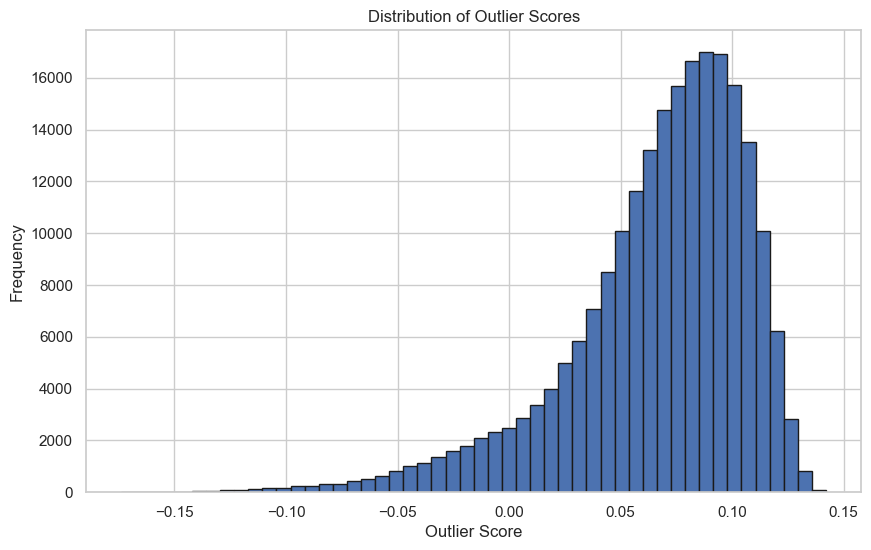

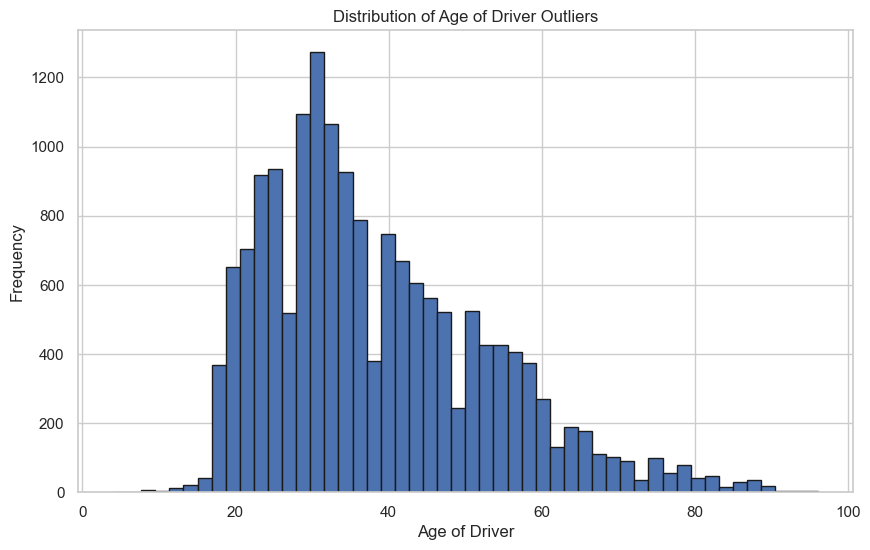

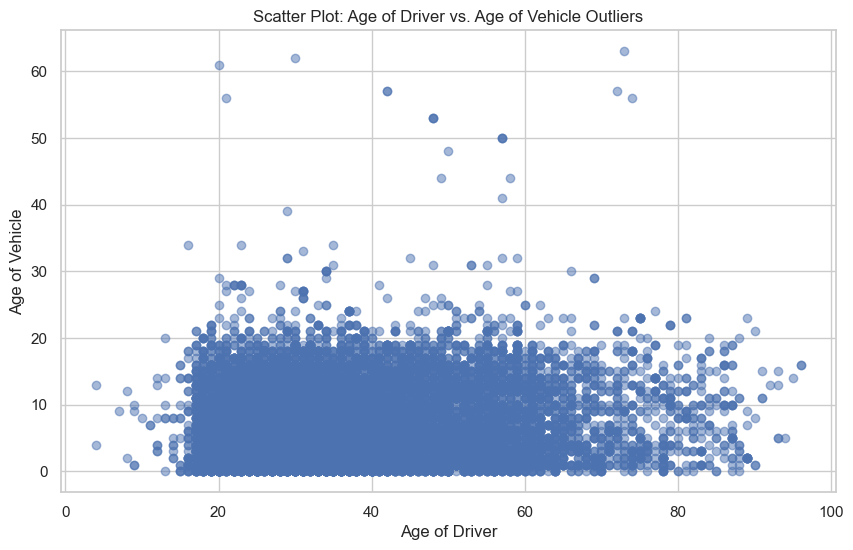

In [143]:
# Select numerical features
numerical_features = df.select_dtypes(include=['float64', 'int64'])

# Scaling the numerical features
scaler = StandardScaler()
scaled_numerical = scaler.fit_transform(numerical_features)

# Initializing the Isolation Forest model
iso_forest = IsolationForest(contamination='auto', random_state=42)

# Fitting the model and predict outliers
outlier_predictions = iso_forest.fit_predict(scaled_numerical)

# Creating a DataFrame with the original data and the outlier label
outlier_df = df.copy()
outlier_df['Outlier'] = outlier_predictions == -1

# Printing the rows identified as outliers
outlier_rows = outlier_df[outlier_df['Outlier']]
print("Outlier Rows:")
print(outlier_rows)

# Visualizing the outlier scores
outlier_scores = iso_forest.decision_function(scaled_numerical)
plt.figure(figsize=(10, 6))
plt.hist(outlier_scores, bins=50, edgecolor='k')
plt.xlabel('Outlier Score')
plt.ylabel('Frequency')
plt.title('Distribution of Outlier Scores')
plt.show()

# Visualizing Age of Driver Outliers
plt.figure(figsize=(10, 6))
plt.hist(df[outlier_df['Outlier']]['age_of_driver'], bins=50, edgecolor='k')
plt.xlabel('Age of Driver')
plt.ylabel('Frequency')
plt.title('Distribution of Age of Driver Outliers')
plt.show()

# Visualize Age of Vehicle Outliers
plt.figure(figsize=(10, 6))
plt.hist(df[outlier_df['Outlier']]['age_of_vehicle'], bins=50, edgecolor='k')
plt.xlabel('Age of Vehicle')
plt.ylabel('Frequency')
plt.title('Distribution of Age of Vehicle Outliers')
plt.show()

# Scatter Plot for Age of Driver vs. Age of Vehicle Outliers
plt.figure(figsize=(10, 6))
plt.scatter(df[outlier_df['Outlier']]['age_of_driver'], df[outlier_df['Outlier']]['age_of_vehicle'], alpha=0.5)
plt.xlabel('Age of Driver')
plt.ylabel('Age of Vehicle')
plt.title('Scatter Plot: Age of Driver vs. Age of Vehicle Outliers')
plt.show()


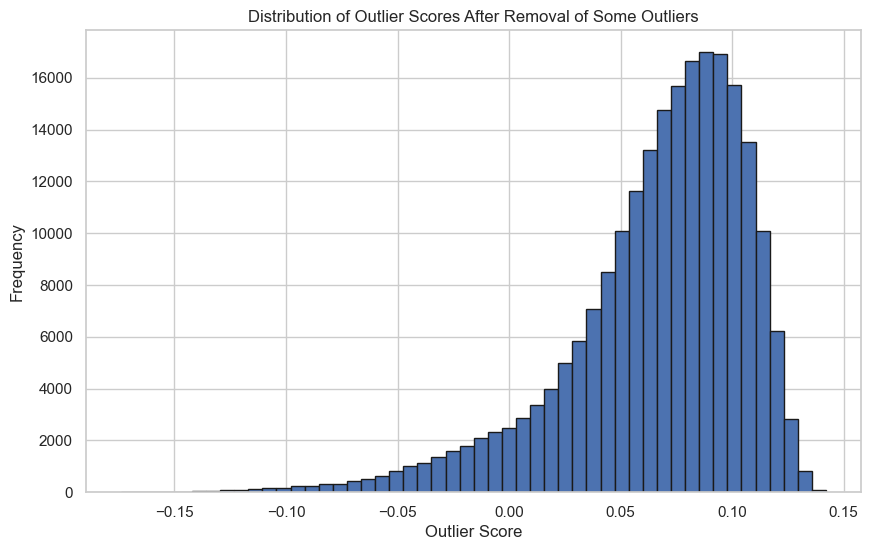

In [190]:
# Visualize the outlier scores
outlier_scores = iso_forest.decision_function(scaled_numerical)
plt.figure(figsize=(10, 6))
plt.hist(outlier_scores, bins=50, edgecolor='k')
plt.xlabel('Outlier Score')
plt.ylabel('Frequency')
plt.title('Distribution of Outlier Scores After Removal of Some Outliers')
plt.show()

# Question 7: Can you develop a classification model using the provided data that accurately predicts fatal injuries sustained in road traffic accidents, with the aim of informing and improving road safety measures?

# CLASSIFICATION MODEL TO PREDICT FATAL ACCIDENT SEVERITY

ANSWER: Predicted Fatal Accident with an Accuracy of 84% and ROC Curve AUC Score of 91%

In [144]:
#making a copy of the df to preserve the original dataframe
data=df.copy()

In [146]:
data['accident_severity'].replace([2,3],0,inplace=True)

In [147]:
data['accident_severity'].value_counts()

0    215642
1      4229
Name: accident_severity, dtype: int64

In [148]:
data.columns

Index(['accident_index', 'accident_year_x', 'location_easting_osgr',
       'location_northing_osgr', 'longitude', 'latitude', 'police_force',
       'accident_severity', 'number_of_vehicles', 'number_of_casualties',
       'day_of_week', 'local_authority_district',
       'local_authority_ons_district', 'local_authority_highway',
       'first_road_class', 'first_road_number', 'road_type', 'speed_limit',
       'junction_detail', 'junction_control', 'second_road_class',
       'second_road_number', 'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag', 'lsoa_of_accident_location', 'casualty_index',
       'accident_year_y', 'accident_reference_y', 'casualty_reference',
       'casualty_class', 'sex_of_casualty', 'age_o

In [149]:
#creating a Label for target
Labels=data['accident_severity']

# Remove unwanted columns that are not useful to predicting accident severity
data.drop(['did_police_officer_attend_scene_of_accident','accident_severity', 'accident_index','accident_year_x','casualty_reference','vehicle_index', 'accident_year_y', 'accident_reference_y', 'casualty_type', 'accident_reference', 'accident_year', 'vehicle_reference_y', 'casualty_severity', 'casualty_index','police_force', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude',
    'age_of_casualty', 'age_band_of_casualty', 'pedestrian_location', 'pedestrian_movement',
    'car_passenger', 'bus_or_coach_passenger', 'pedestrian_road_maintenance_worker', 'casualty_home_area_type',
    'casualty_imd_decile', 'vehicle_index','casualty_class','casualty_home_area_type',
    'sex_of_casualty', 'casualty_severity', 'casualty_type','vehicle_type','propulsion_code','vehicle_left_hand_drive',
    'vehicle_direction_from', 'vehicle_direction_to','first_point_of_impact','towing_and_articulation',
    'age_band_of_driver','date', 'time','accident_reference_x', 'vehicle_reference_x'], axis=1, inplace=True)


In [150]:
#selecting numerical data
Numeric_data = data.select_dtypes(include=[np.number])
rus=RandomUnderSampler()
# Create a balanced dataset using the RandomUnderSampler
balanced_df, balanced_labels = rus.fit_resample(Numeric_data, Labels)

In [151]:
balanced_df.sample(2)

,number_of_vehicles,number_of_casualties,day_of_week,local_authority_district,first_road_class,first_road_number,road_type,speed_limit,junction_detail,second_road_class,...,vehicle_leaving_carriageway,hit_object_off_carriageway,journey_purpose_of_driver,sex_of_driver,age_of_driver,engine_capacity_cc,age_of_vehicle,driver_imd_decile,driver_home_area_type,Hour
2081,2,1,1,128,3,57,3,30,9,6,...,0,0,1,1,52,1910,13,3,1,17
6558,1,1,1,434,3,1081,6,30,3,6,...,0,0,1,1,23,2987,4,10,1,19


In [152]:
balanced_labels

0       0
1       0
2       0
3       0
4       0
       ..
8453    1
8454    1
8455    1
8456    1
8457    1
Name: accident_severity, Length: 8458, dtype: int64

In [153]:
balanced_df.columns

Index(['number_of_vehicles', 'number_of_casualties', 'day_of_week',
       'local_authority_district', 'first_road_class', 'first_road_number',
       'road_type', 'speed_limit', 'junction_detail', 'second_road_class',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'trunk_road_flag', 'vehicle_manoeuvre',
       'vehicle_location_restricted_lane', 'junction_location',
       'skidding_and_overturning', 'hit_object_in_carriageway',
       'vehicle_leaving_carriageway', 'hit_object_off_carriageway',
       'journey_purpose_of_driver', 'sex_of_driver', 'age_of_driver',
       'engine_capacity_cc', 'age_of_vehicle', 'driver_imd_decile',
       'driver_home_area_type', 'Hour'],
      dtype='object')

# Balancing of Data Using RandomUnder-Sampling Technique

In [ ]:
# Create a random undersampler
rus = RandomUnderSampler(random_state=42)

# keeping columns that are numbers
balanced_df = balanced_df.select_dtypes([np.number])

# Fit the random undersampler to the data
X_res, y_res = rus.fit_resample(balanced_df, balanced_labels)

# Feature Selection Using K-BEST Feature Selection

In [154]:
# Set the random state
feature_selector = SelectKBest(f_classif, k=10)

# Fit the feature selector to the data
feature_selector.fit(X_res, y_res)

# Getting the mask that will select the best features
feature_mask = feature_selector.get_support()

# Getting the names of the selected features
selected_feature_names = [
    feature for feature, selected in zip(balanced_df.columns, feature_mask) if selected
]

# Getting the scores of the selected features
selected_feature_scores = feature_selector.scores_[feature_mask]

# Create a DataFrame with the selected features and their scores
selected_features_df = pd.DataFrame({
    'Feature': selected_feature_names,
    'Score': selected_feature_scores
})

# Printing the selected features DataFrame
print(selected_features_df)



                      Feature        Score
0          number_of_vehicles   190.236471
1        number_of_casualties   542.877225
2    local_authority_district   266.634718
3            first_road_class   235.503842
4                 speed_limit  1198.235503
5           second_road_class   556.643862
6         urban_or_rural_area   968.770047
7           junction_location   455.665315
8  hit_object_off_carriageway   226.545202
9               sex_of_driver   276.814512


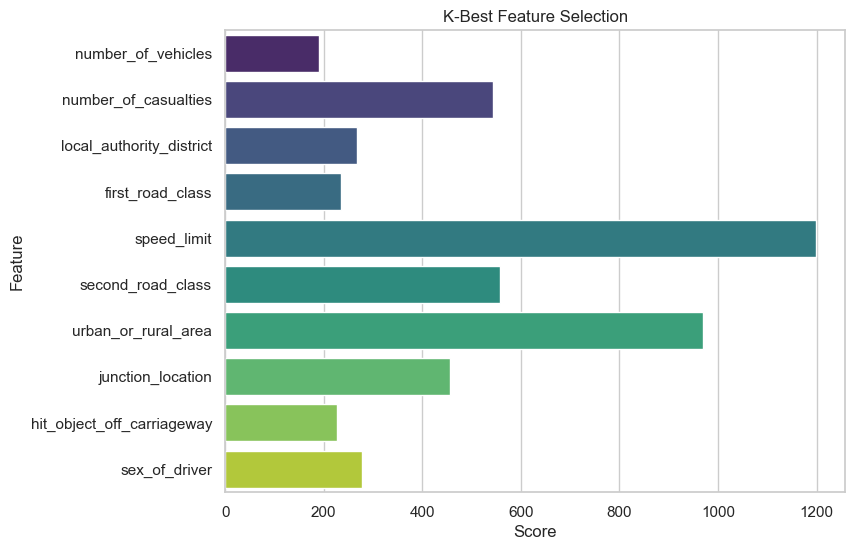

In [188]:
# Create a bar plot using Seaborn
plt.figure(figsize=(8, 6))
sns.barplot(x=selected_feature_scores, y=selected_feature_names, palette='viridis')
plt.xlabel('Score')
plt.ylabel('Feature')
plt.title('K-Best Feature Selection')

plt.show()

In [184]:
X_res[selected_feature_names]

number_of_vehicles            int64
number_of_casualties          int64
local_authority_district      int64
first_road_class              int64
speed_limit                   int64
second_road_class             int64
urban_or_rural_area           int64
junction_location             int64
hit_object_off_carriageway    int64
sex_of_driver                 int64
dtype: object

# Splitting of Data Using Train-Test Split

In [157]:
# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_res[selected_feature_names], y_res, test_size=0.20, random_state=1)


In [158]:
# Split the data into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_res[selected_feature_names], y_res, test_size=0.25, random_state=1)


# Normalization of Data Using Min-Max Scaler

In [159]:
# Normalize the data
scaler = MinMaxScaler()
X_train= scaler.fit_transform(X_train)

X_test= scaler.transform(X_test)
X_val = scaler.transform(X_val)

In [160]:
# Define function to get stacking classifier
def get_stacking():
    level0 = list()
    level0.append(('dtree', DecisionTreeClassifier()))
    level0.append(('gb', GradientBoostingClassifier()))
    level0.append(('rf', RandomForestClassifier()))
    level1 = LogisticRegression()
    model = StackingClassifier(estimators=level0, final_estimator=level1, cv=5)
    return model
# Define function to get a dictionary of models

def get_models():
    models = dict()
    models['dtree'] = DecisionTreeClassifier()
    models['gb'] = GradientBoostingClassifier()
    models['rf'] = RandomForestClassifier()
    models['lr'] = LogisticRegression()
    models['Stacked'] = get_stacking()
    return models

In [161]:
def evaluate_model(model, X, y):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    return scores

In [162]:
# Get the list of models
models = get_models()

# Run and Evaluate the models
results, names = list(), list()
for name, model in models.items():
    scores = evaluate_model(model, X_train, y_train)
    results.append(scores)
    names.append(name)
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))


>dtree 0.808 (0.014)
>gb 0.749 (0.016)
>rf 0.824 (0.012)
>lr 0.703 (0.017)
>Stacked 0.832 (0.013)


In [167]:
#calculating accuracy using random forest model on val set
rf= RandomForestClassifier()
rf.fit(X_train,y_train)
Y_pred = rf.predict(X_val)
rf.score(X_val, y_val)
acc_rf = round(rf.score(X_val, y_val) * 100, 2)



In [168]:
acc_rf

83.97

In [169]:
#calculating accuracy on test set
rf= RandomForestClassifier()
rf.fit(X_train,y_train)
Y_pred = rf.predict(X_test)
rf.score(X_test, y_test)
acc_rf = round(rf.score(X_test, y_test) * 100, 2)


In [170]:
acc_rf

84.04

In [171]:
report=classification_report(y_test,Y_pred)
print(report)   

              precision    recall  f1-score   support

           0       0.85      0.82      0.83       829
           1       0.83      0.86      0.85       863

    accuracy                           0.84      1692
   macro avg       0.84      0.84      0.84      1692
weighted avg       0.84      0.84      0.84      1692



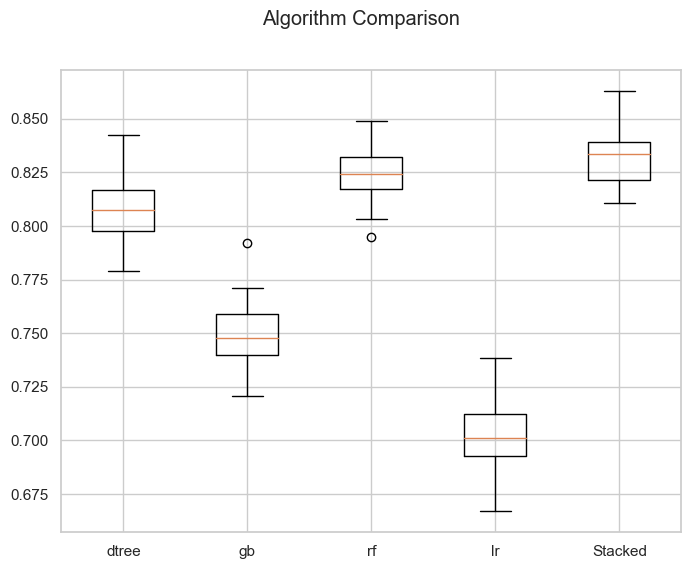

In [172]:
fig = plt.figure(figsize=(8,6)) 
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

In [173]:
pd.crosstab(y_test, Y_pred, rownames=['Actual'], colnames=['Predicted'], margins=True)

Predicted,0,1,All
Actual,,,
0,682,147,829
1,123,740,863
All,805,887,1692


In [174]:
# Create a Df to display the results
results_df = pd.DataFrame({'Actual': y_test, 'Predicted': Y_pred})

# Add a column to show correctness
results_df['Correct'] = results_df['Actual'] == results_df['Predicted']

# Display the DataFrame
print(results_df)


      Actual  Predicted  Correct
7132       1          1     True
5473       1          1     True
1690       0          0     True
1615       0          1    False
5974       1          1     True
...      ...        ...      ...
3972       0          0     True
8325       1          1     True
2167       0          1    False
7546       1          0    False
5342       1          0    False

[1692 rows x 3 columns]


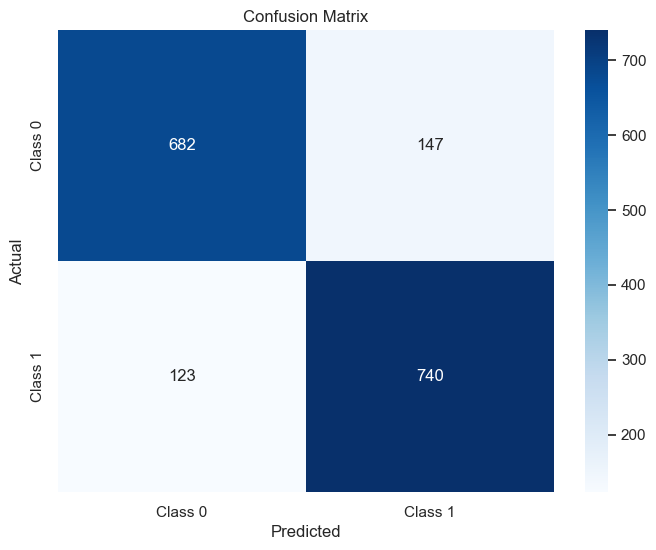

In [175]:
# Generate the confusion matrix
conf_matrix = confusion_matrix(y_test, Y_pred)

# Plot the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=["Class 0", "Class 1"], yticklabels=["Class 0", "Class 1"])
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

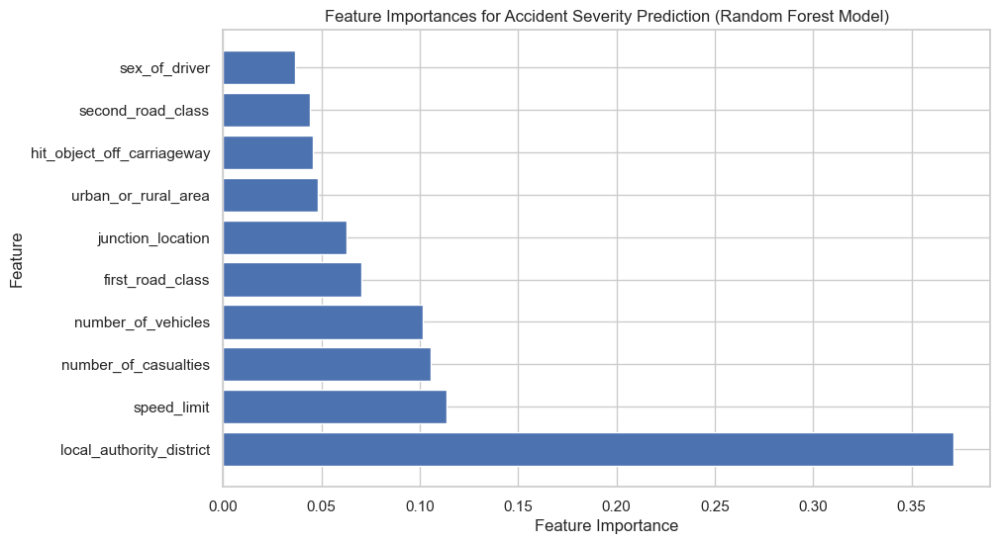

In [176]:
# Get feature importances from the Random Forest model
feature_importances = rf.feature_importances_

# Creating a dictionary of feature importances and feature names
feature_importances_dict = dict(zip(selected_feature_names, feature_importances))

# Sort the feature importances by their values
sorted_feature_importances = sorted(feature_importances_dict.items(), key=lambda x: x[1], reverse=True)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.barh([x[0] for x in sorted_feature_importances], [x[1] for x in sorted_feature_importances])
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.title('Feature Importances for Accident Severity Prediction (Random Forest Model)')
plt.show()


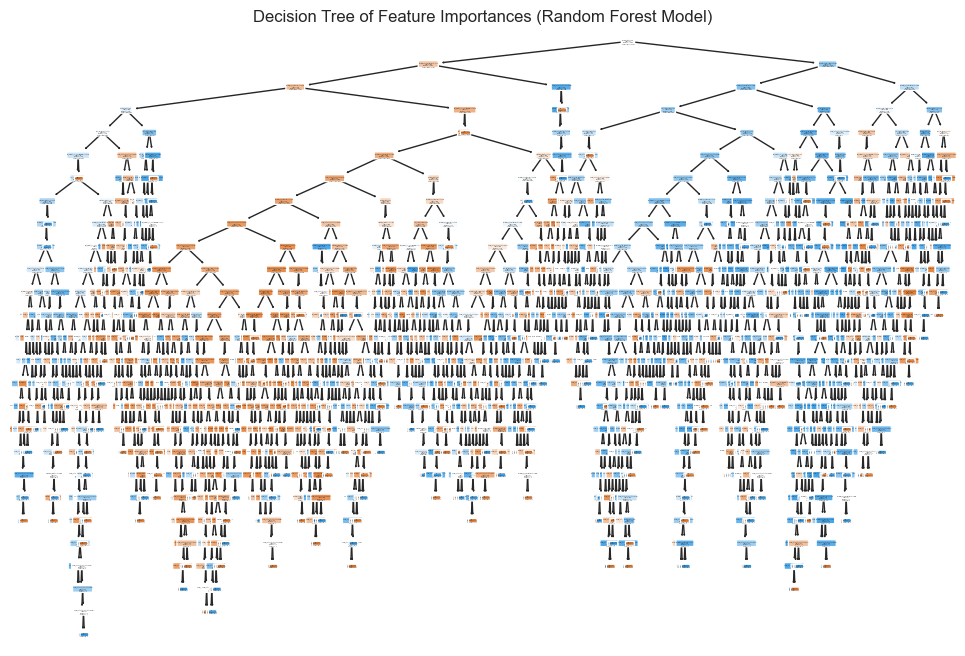

In [182]:
# Getting one of the decision trees from the Random Forest model
tree = rf.estimators_[0]

# Plot the decision tree
plt.figure(figsize=(12, 8))
plot_tree(tree, feature_names=selected_feature_names, filled=True, rounded=True)
plt.title('Decision Tree of Feature Importances (Random Forest Model)')
plt.show()


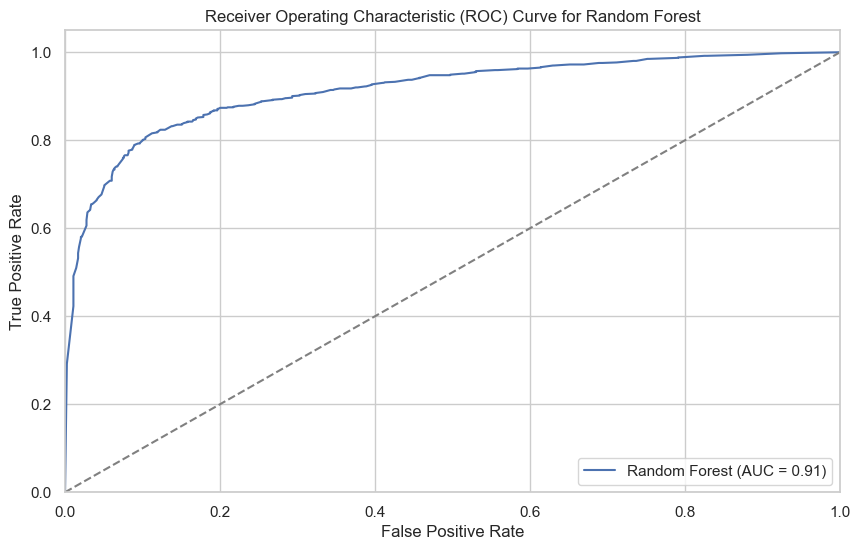

In [178]:
rf.fit(X_train, y_train)

# Getting predicted probabilities for the positive class
y_pred_proba_rf = rf.predict_proba(X_test)[:, 1]

# Computing ROC curve and ROC AUC score for the Random Forest model
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_pred_proba_rf)
roc_auc_rf = auc(fpr_rf, tpr_rf)

# Plotting ROC curve for the Random Forest classifier
plt.figure(figsize=(10, 6))
plt.plot(fpr_rf, tpr_rf, color='b', label='Random Forest (AUC = {:.2f})'.format(roc_auc_rf))
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Random Forest')
plt.legend(loc='lower right')
plt.show()
